# Customer Segmentation Analysis: Insights Through Clustering and Dimensionality Reduction  
### An Application of Unsupervised Learning  

**Mukhammadkodir Abdusalomov**  
**January 2025**  
**Unsupervised Learning**  
**Faculty of Economic Sciences**  
**Department of Data Science**  
**University of Warsaw**  
**Supervised by: dr hab. prof. Jacek Lewkowicz**  

### Introduction
This project explores customer segmentation using a dataset containing detailed consumer information, including demographic, transactional, and behavioral data. The dataset comprises 2,240 rows and 29 columns, representing individual customers and their characteristics. By analyzing these features, I aim to uncover patterns and insights that can drive strategic decision-making, such as targeted marketing and personalized product recommendations.

### Key Features of the Dataset
Demographics:  
   - Year_Birth: Year of birth of the customer.  
   - Education: Education level (Graduation, PhD).  
   - Marital_Status: Marital status of the customer (Single, Married).  

Household Composition:  
   - Kidhome: Number of children in the household.  
   - Teenhome: Number of teenagers in the household.  

Income and Spending:  
   - Income: Customer's annual income.  
   - MntWines, MntFruits, MntMeatProducts. Ex: Amount spent on various product categories.  
   - NumWebVisitsMonth: Frequency of website visits per month.  

Campaign and Customer Responses:  
   - AcceptedCmp1 - AcceptedCmp5: Indicators of whether the customer accepted marketing campaigns.  
   - Complain: Whether the customer has filed a complaint.  
   - Response: Overall response to the last marketing campaign.

### Data Cleaning and Preparation
During preprocessing, missing values and inconsistencies were addressed to ensure data quality:
- Income and Spending columns: Missing values were imputed using median values.  
- Categorical columns: Standardized and encoded for analysis.  
- Outliers: Detected and mitigated where necessary to improve model performance.

---

### Project Goals and Methodology

The primary goal of this project is to segment customers into distinct groups based on their similarities. By employing clustering algorithms and dimensionality reduction techniques, I can uncover patterns in customer behavior and enhance the interpretability of results.

### Project Plan:
Clustering Techniques:  
   - Implemented K-Means, DBSCAN, GMM, Hierarchical widely-used clustering algorithms, to group customers based on spending, demographics, and campaign responses.  
   - Experimented with various dimensionality reduction techniques like: PCA, t-SNE, Isomap, MDS to improve visualization and clustering accuracy.  

Dimensionality Reduction:  
   - PCA (Principal Component Analysis): Used to reduce high-dimensional data while retaining 95% of the variance.  
   - t-SNE and Isomap: Non-linear techniques applied for visualization and further insights into data patterns.  

Evaluation and Visualization:  
   - Visualized clusters in 2D and 3D spaces to interpret customer segments.  
   - Analyzed the distinct characteristics of each cluster to draw actionable insights.

---

Understanding customer segmentation is essential for businesses aiming to improve customer satisfaction and optimize marketing strategies. This analysis provides actionable insights by:
- Identifying distinct customer groups based on spending habits and demographics.
- Revealing trends and patterns that guide targeted marketing campaigns.
- Enhancing decision-making through data-driven segmentation.

This project demonstrates how clustering and dimensionality reduction can be combined to uncover meaningful insights in customer data.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from pathlib import Path
from scipy.stats import zscore
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from mpl_toolkits.mplot3d import Axes3D
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [3]:
file_path = Path('customer_segmentation.csv')

In [5]:
df = pd.read_csv(file_path)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [7]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [11]:
categorical_columns = df.select_dtypes(include=['object']).columns
print("\nUnique Values in Categorical Columns:")
for col in categorical_columns:
    print(f"{col}: {df[col].unique()}")
    break


Unique Values in Categorical Columns:
Education: ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']


In [13]:
missing_values = df.isnull().sum()
missing_values

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [15]:
missing_columns = missing_values[missing_values > 0]
if missing_columns.empty:
    print("No missing values in the dataset.")
else:
    print("Columns with missing values:")
    print(missing_columns)

Columns with missing values:
Income    24
dtype: int64


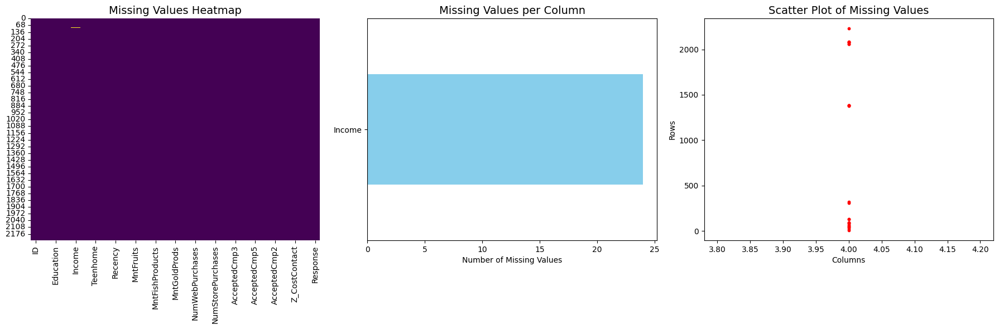

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
missing_data = df.isnull()
sns.heatmap(missing_data, cmap='viridis', cbar=False, ax=axes[0])
axes[0].set_title('Missing Values Heatmap', fontsize=14)
missing_counts = df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0]
if not missing_counts.empty:
    missing_counts.sort_values().plot(kind='barh', color='skyblue', ax=axes[1])
    axes[1].set_title('Missing Values per Column', fontsize=14)
    axes[1].set_xlabel('Number of Missing Values')
else:
    axes[1].text(0.5, 0.5, 'No Missing Values', ha='center', va='center', fontsize=14, color='green')
    axes[1].set_title('Missing Values per Column', fontsize=14)
axes[2].scatter(np.where(df.isnull())[1], np.where(df.isnull())[0], color='red', s=10)
axes[2].set_title('Scatter Plot of Missing Values', fontsize=14)
axes[2].set_xlabel('Columns')
axes[2].set_ylabel('Rows')
plt.tight_layout()
plt.show()

Label Encoding: Converts each category into an integer. This is more suitable for ordinal categorical variables, where there’s a clear order (Low, Medium, High).

In [19]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

In [21]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,2,4,58138.0,0,0,80,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,2,4,46344.0,1,1,157,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,2,5,71613.0,0,0,444,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,2,5,26646.0,1,0,199,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,4,3,58293.0,1,0,390,94,173,...,5,0,0,0,0,0,0,3,11,0


In [23]:
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of duplicate rows: 0


In [25]:
print(df.dtypes)

ID                       int64
Year_Birth               int64
Education                int32
Marital_Status           int32
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer              int32
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object


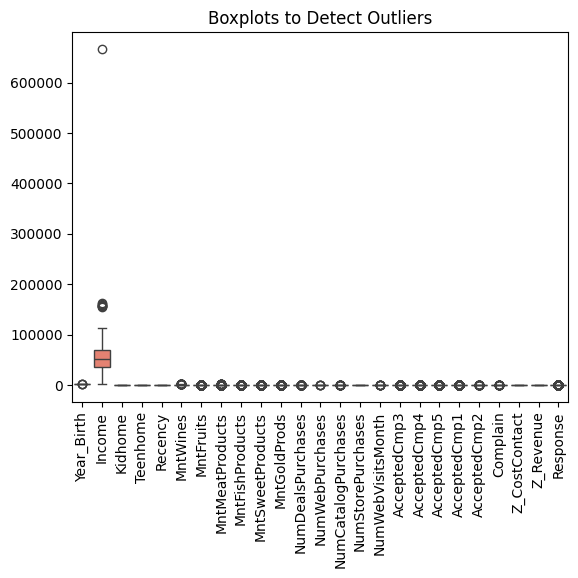

In [27]:
numerical_columns = [
    'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
    'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
    'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4',
    'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'
]
sns.boxplot(data=df[numerical_columns])
plt.xticks(rotation=90)
plt.title("Boxplots to Detect Outliers")
plt.show()

In [29]:
for col in numerical_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print(f"Outliers in {col}: {len(outliers)}")
    print(outliers[[col]]) 
    print("\n")

Outliers in Year_Birth: 3
     Year_Birth
192        1900
239        1893
339        1899


Outliers in Income: 8
        Income
164   157243.0
617   162397.0
655   153924.0
687   160803.0
1300  157733.0
1653  157146.0
2132  156924.0
2233  666666.0


Outliers in Kidhome: 0
Empty DataFrame
Columns: [Kidhome]
Index: []


Outliers in Teenhome: 0
Empty DataFrame
Columns: [Teenhome]
Index: []


Outliers in Recency: 0
Empty DataFrame
Columns: [Recency]
Index: []


Outliers in MntWines: 35
      MntWines
111       1332
161       1349
295       1241
424       1285
430       1248
466       1239
497       1396
515       1288
523       1379
543       1478
559       1492
824       1492
826       1279
870       1308
917       1478
937       1253
987       1394
990       1296
1001      1285
1010      1230
1052      1315
1191      1298
1458      1302
1488      1449
1492      1259
1577      1252
1641      1459
1749      1493
1922      1324
1953      1285
1961      1462
1992      1276
2067      1245
20

In [31]:
df['Year_Birth'] = df['Year_Birth'].apply(lambda x: 2000 if x < 1930 else (x if x >= 1930 else 2000))
income_upper_bound = df['Income'].quantile(0.95) 
df['Income'] = df['Income'].apply(lambda x: min(x, income_upper_bound))
mnt_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
for col in mnt_columns:
    mnt_upper_bound = df[col].quantile(0.95)
    df[col] = df[col].apply(lambda x: min(x, mnt_upper_bound))
accepted_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain']
for col in accepted_columns:
    df[col] = df[col].apply(lambda x: min(x, 1))
print(df[['Year_Birth', 'Income'] + mnt_columns].describe())

        Year_Birth        Income     MntWines    MntFruits  MntMeatProducts  \
count  2240.000000   2216.000000  2240.000000  2240.000000      2240.000000   
mean   1968.943304  51482.556859   295.283482    24.774107       158.981786   
std      11.749275  20274.980199   314.215631    34.857790       198.671350   
min    1940.000000   1730.000000     0.000000     0.000000         0.000000   
25%    1959.000000  35303.000000    23.750000     1.000000        16.000000   
50%    1970.000000  51381.500000   173.500000     8.000000        67.000000   
75%    1977.000000  68522.000000   504.250000    33.000000       232.000000   
max    2000.000000  84130.000000  1000.000000   123.000000       687.100000   

       MntFishProducts  MntSweetProducts  MntGoldProds  
count      2240.000000       2240.000000   2240.000000  
mean         35.659196         25.435268     42.151161  
std          48.913800         35.999396     46.286135  
min           0.000000          0.000000      0.000000  
25%

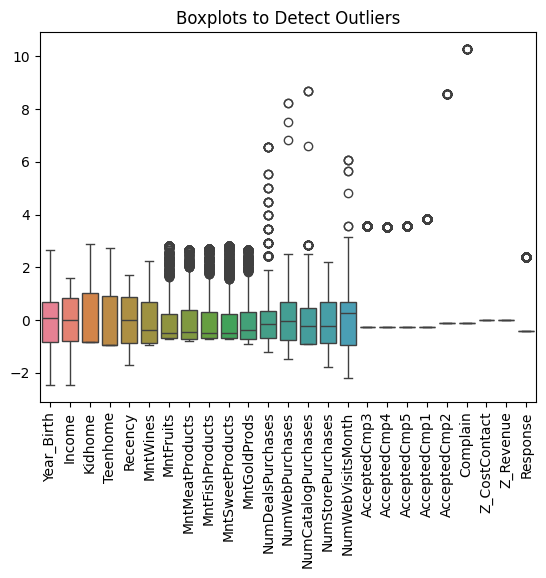

In [37]:
sns.boxplot(data=df[numerical_columns])
plt.xticks(rotation=90)
plt.title("Boxplots to Detect Outliers")
plt.show()

In [35]:
scaler = StandardScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])
print(df[numerical_columns].head())

   Year_Birth    Income   Kidhome  Teenhome   Recency  MntWines  MntFruits  \
0   -1.016741  0.328333 -0.825218 -0.929894  0.307039  1.081399   1.814229   
1   -1.272133 -0.253500  1.032559  0.906934 -0.383664 -0.904942  -0.682184   
2   -0.335696  0.993095 -0.825218 -0.929894 -0.798086  0.416102   0.695147   
3    1.281786 -1.225262  1.032559 -0.929894 -0.798086 -0.904942  -0.596100   
4    1.026394  0.335980  1.032559 -0.929894  1.550305 -0.389257   0.522981   

   MntMeatProducts  MntFishProducts  MntSweetProducts  ...  NumWebVisitsMonth  \
0         1.948467         2.707219          1.738326  ...           0.693904   
1        -0.770196        -0.688287         -0.678920  ...          -0.130463   
2        -0.161014         1.540621         -0.123231  ...          -0.542647   
3        -0.699712        -0.524697         -0.623351  ...           0.281720   
4        -0.206325         0.211456          0.043475  ...          -0.130463   

   AcceptedCmp3  AcceptedCmp4  AcceptedCmp5 

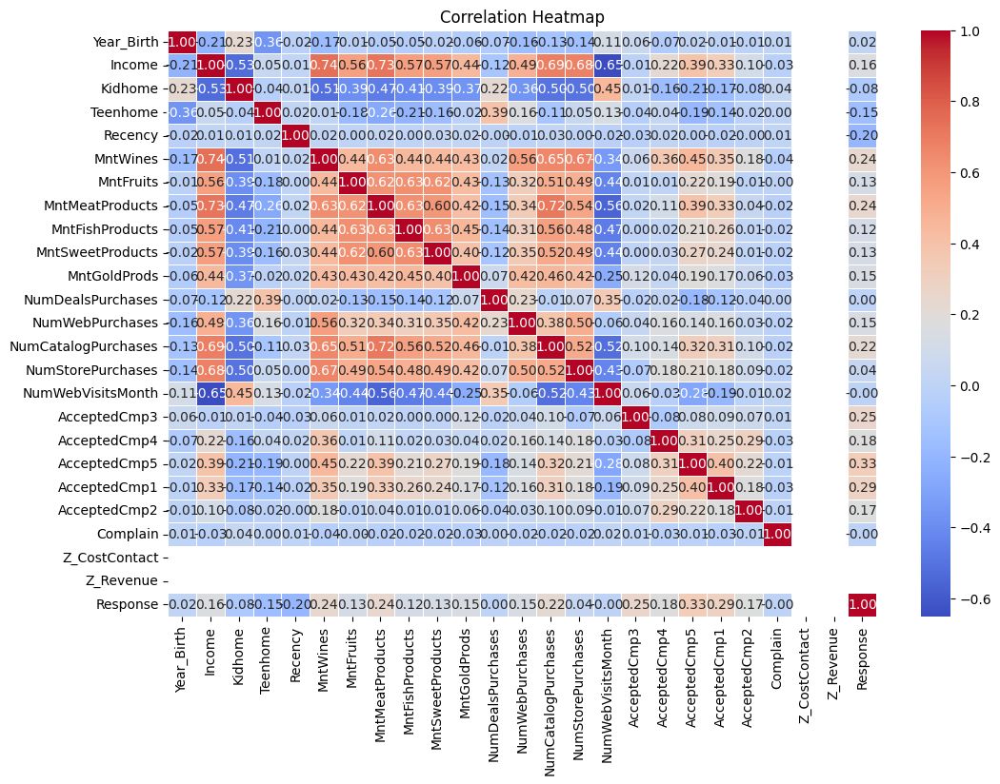

In [39]:
correlation_matrix = df[numerical_columns].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [41]:
skewness = df[numerical_columns].skew()
high_skew = skewness[abs(skewness) > 1]
print("High Skewness Columns:")
print(high_skew)

High Skewness Columns:
MntFruits               1.681791
MntMeatProducts         1.441300
MntFishProducts         1.579986
MntSweetProducts        1.677092
MntGoldProds            1.426140
NumDealsPurchases       2.418569
NumWebPurchases         1.382794
NumCatalogPurchases     1.880989
AcceptedCmp3            3.291705
AcceptedCmp4            3.241574
AcceptedCmp5            3.291705
AcceptedCmp1            3.555444
AcceptedCmp2            8.472093
Complain               10.188972
Response                1.971555
dtype: float64


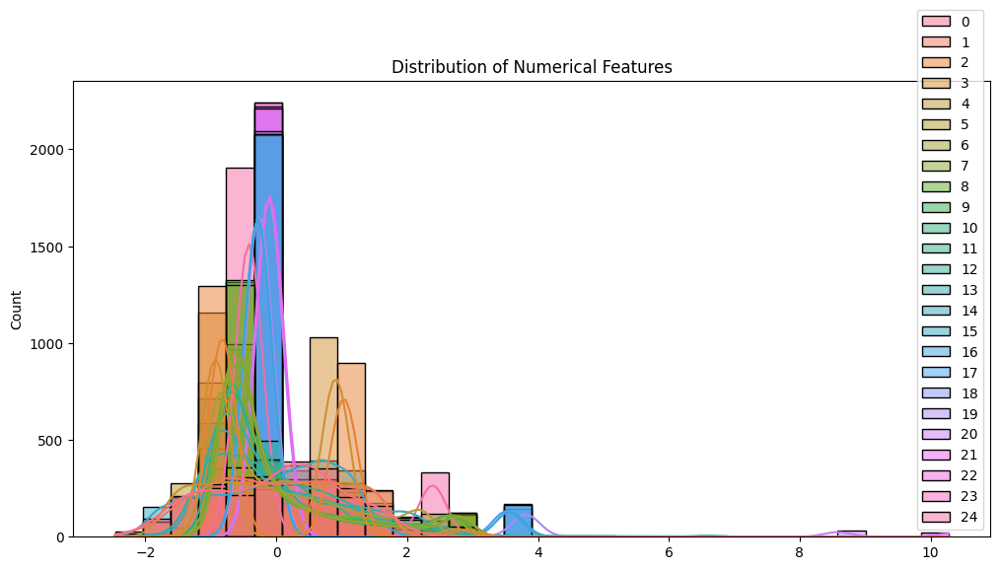

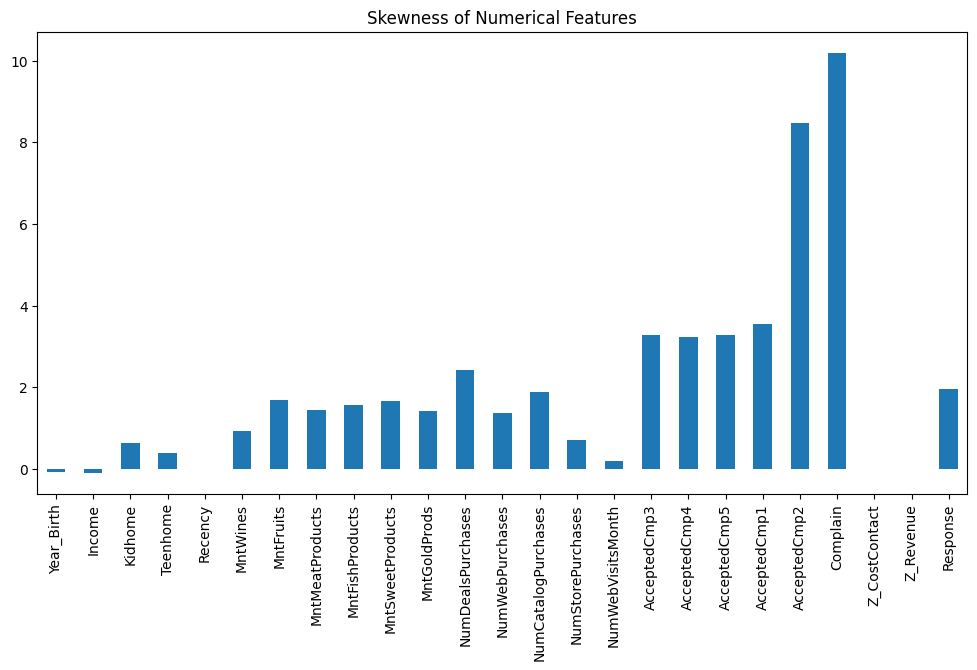

In [43]:
plt.figure(figsize=(12, 6))
sns.histplot(df[numerical_columns].values, kde=True, bins=30)
plt.title("Distribution of Numerical Features")
plt.show()
df[numerical_columns].skew().plot(kind='bar', figsize=(12, 6))
plt.title("Skewness of Numerical Features")
plt.show()

In [45]:
for col in high_skew.index:
    if df[col].min() > 0:
        df[col] = np.log1p(df[col])
    else:
        df[col] = np.sqrt(df[col]) 
new_skewness = df[numerical_columns].skew()
print("Skewness after transformation:")
print(new_skewness)

Skewness after transformation:
Year_Birth            -0.077796
Income                -0.088222
Kidhome                0.635288
Teenhome               0.407115
Recency               -0.001987
MntWines               0.930549
MntFruits             -0.084519
MntMeatProducts       -0.193480
MntFishProducts       -0.165299
MntSweetProducts      -0.081140
MntGoldProds          -0.102026
NumDealsPurchases      1.273943
NumWebPurchases        0.976051
NumCatalogPurchases    0.522669
NumStorePurchases      0.702237
NumWebVisitsMonth      0.207926
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64


C:\Users\khali\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


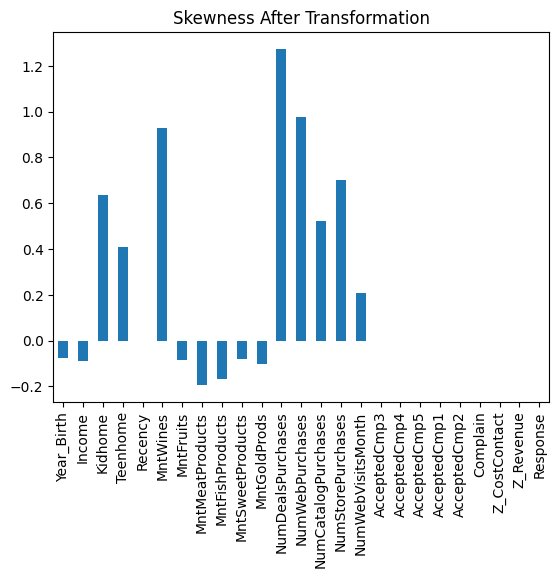

In [47]:
df[numerical_columns].skew().plot(kind='bar')
plt.title("Skewness After Transformation")
plt.show()

In [49]:
print(df[numerical_columns].describe())

         Year_Birth        Income       Kidhome      Teenhome       Recency  \
count  2.240000e+03  2.216000e+03  2.240000e+03  2.240000e+03  2.240000e+03   
mean   7.184729e-15  4.328667e-17 -1.586033e-17 -3.172066e-18 -3.172066e-18   
std    1.000223e+00  1.000226e+00  1.000223e+00  1.000223e+00  1.000223e+00   
min   -2.463962e+00 -2.454443e+00 -8.252176e-01 -9.298944e-01 -1.696001e+00   
25%   -8.464798e-01 -7.981862e-01 -8.252176e-01 -9.298944e-01 -8.671566e-01   
50%    8.995724e-02 -4.985439e-03 -8.252176e-01 -9.298944e-01 -3.777284e-03   
75%    6.858717e-01  8.406069e-01  1.032559e+00  9.069340e-01  8.596020e-01   
max    2.643876e+00  1.610596e+00  2.890335e+00  2.743762e+00  1.722981e+00   

           MntWines   MntFruits  MntMeatProducts  MntFishProducts  \
count  2.240000e+03  675.000000       721.000000       683.000000   
mean  -5.233909e-17    1.009604         1.010501         1.025598   
std    1.000223e+00    0.487869         0.451683         0.465945   
min   -9.399

Text(0.5, 1.0, 'Boxplots to Detect Outliers after some removals')

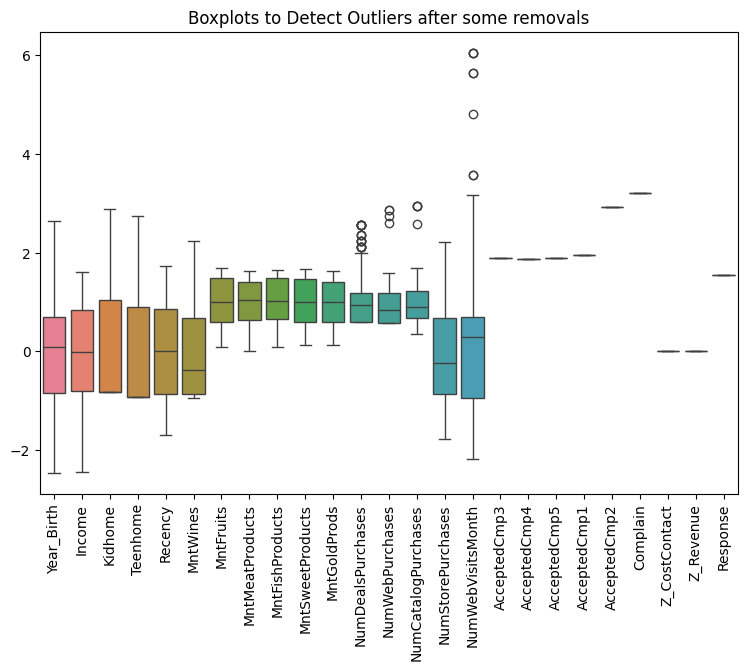

In [51]:
plt.figure(figsize=(9, 6))
sns.boxplot(data=df[numerical_columns])
plt.xticks(rotation=90)
plt.title("Boxplots to Detect Outliers after some removals")

Skewness of MntWines: 0.9305492826177515


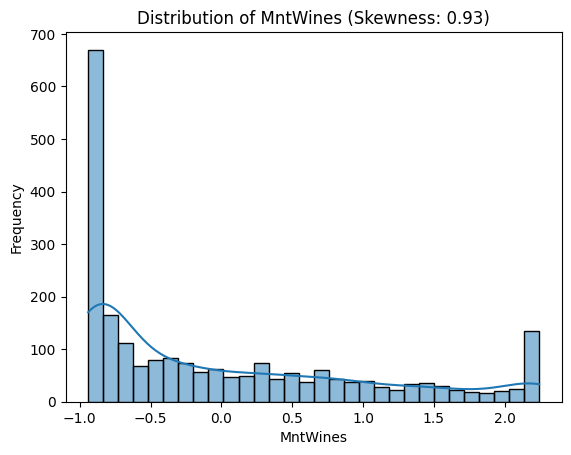

Skewness of MntFruits: -0.08451913007234826


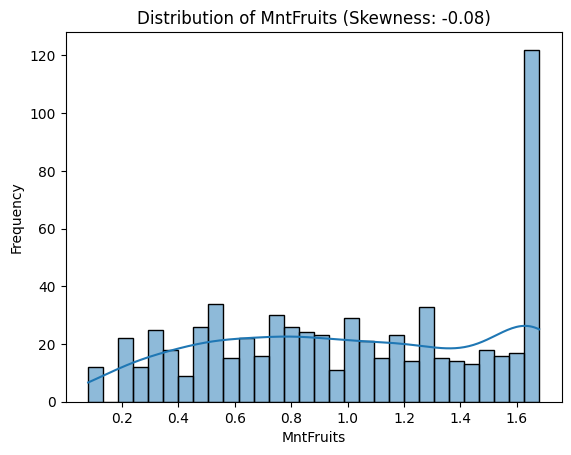

Skewness of Income: -0.08822232953216318


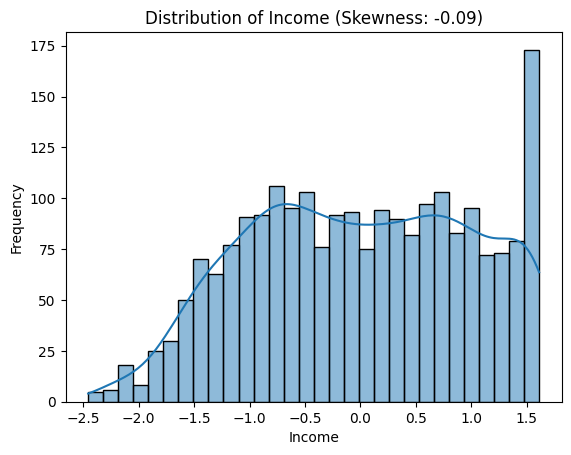

Skewness of NumDealsPurchases: 1.2739430129642455


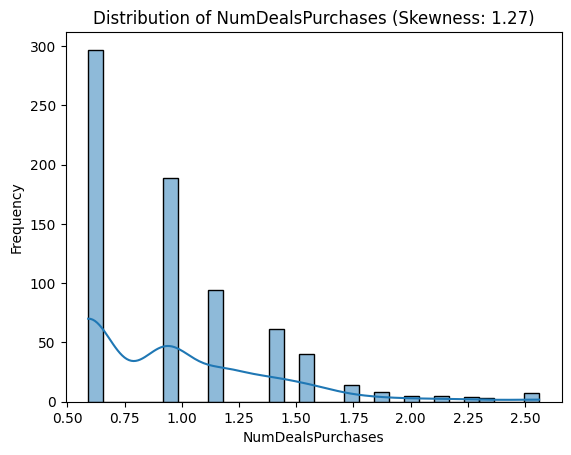

In [53]:
columns_to_check = ['MntWines', 'MntFruits', 'Income', 'NumDealsPurchases']
for column in columns_to_check:
    skewness = df[column].skew()
    print(f"Skewness of {column}: {skewness}")
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f"Distribution of {column} (Skewness: {skewness:.2f})")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

Filling missing values with mean if it is numeric and with most frequent occuring values for categorical data

In [55]:
df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())
df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

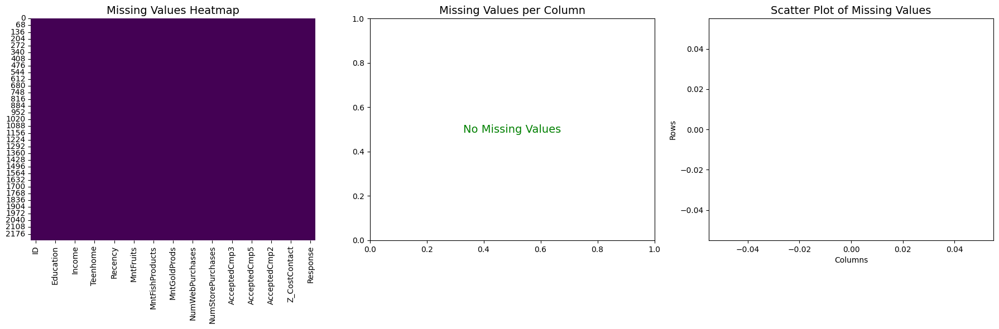

In [57]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
missing_data = df.isnull()
sns.heatmap(missing_data, cmap='viridis', cbar=False, ax=axes[0])
axes[0].set_title('Missing Values Heatmap', fontsize=14)
missing_counts = df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0] 
if not missing_counts.empty:
    missing_counts.sort_values().plot(kind='barh', color='skyblue', ax=axes[1])
    axes[1].set_title('Missing Values per Column', fontsize=14)
    axes[1].set_xlabel('Number of Missing Values')
else:
    axes[1].text(0.5, 0.5, 'No Missing Values', ha='center', va='center', fontsize=14, color='green')
    axes[1].set_title('Missing Values per Column', fontsize=14)
axes[2].scatter(np.where(df.isnull())[1], np.where(df.isnull())[0], color='red', s=10)
axes[2].set_title('Scatter Plot of Missing Values', fontsize=14)
axes[2].set_xlabel('Columns')
axes[2].set_ylabel('Rows')
plt.tight_layout()
plt.show()

                 ID    Year_Birth        Income       Kidhome      Teenhome  \
count   2240.000000  2.240000e+03  2.240000e+03  2.240000e+03  2.240000e+03   
mean    5592.159821  7.184729e-15  4.282289e-17 -1.586033e-17 -3.172066e-18   
std     3246.662198  1.000223e+00  9.948505e-01  1.000223e+00  1.000223e+00   
min        0.000000 -2.463962e+00 -2.454443e+00 -8.252176e-01 -9.298944e-01   
25%     2828.250000 -8.464798e-01 -7.865559e-01 -8.252176e-01 -9.298944e-01   
50%     5458.500000  8.995724e-02  4.328667e-17 -8.252176e-01 -9.298944e-01   
75%     8427.750000  6.858717e-01  8.291494e-01  1.032559e+00  9.069340e-01   
max    11191.000000  2.643876e+00  1.610596e+00  2.890335e+00  2.743762e+00   

            Recency      MntWines    MntFruits  MntMeatProducts  \
count  2.240000e+03  2.240000e+03  2240.000000      2240.000000   
mean  -3.172066e-18 -5.233909e-17     1.009604         1.010501   
std    1.000223e+00  1.000223e+00     0.267674         0.256137   
min   -1.696001e+00 

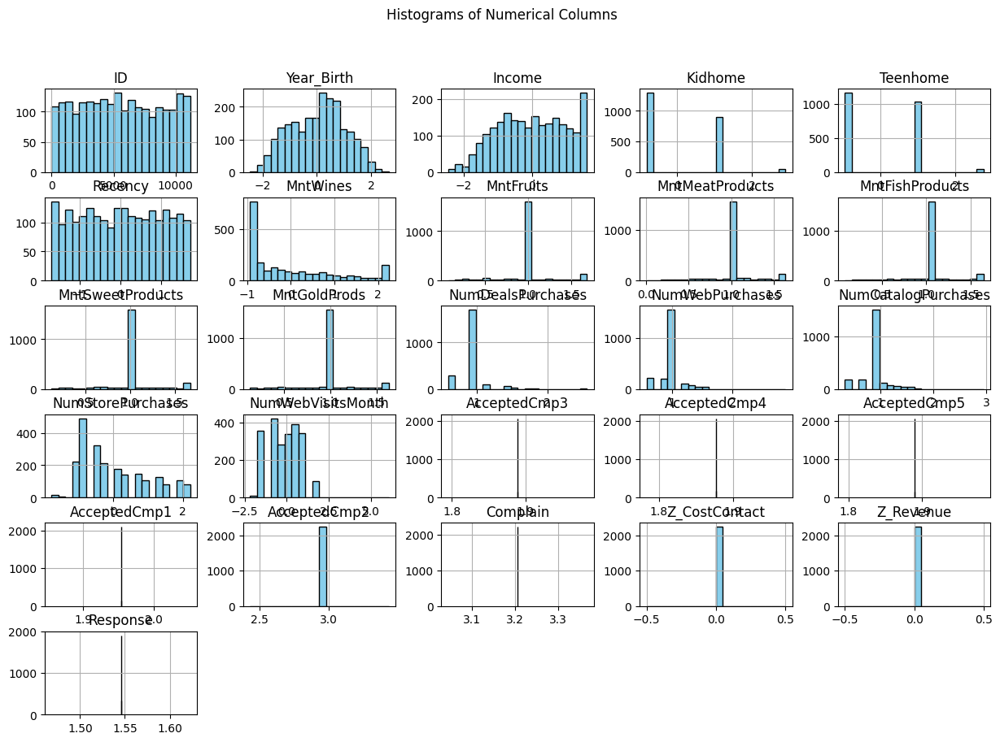

In [59]:
df.select_dtypes(include=['int64', 'float64']).hist(figsize=(15, 10), bins=20, color='skyblue', edgecolor='black')
plt.suptitle("Histograms of Numerical Columns")
print(df.select_dtypes(include=['int64', 'float64']).describe())

Z_score and zcontact has std of 0

In [69]:
variance = df.select_dtypes(include=['int64', 'float64']).var()
print(variance)
high_variance_columns = variance[variance > threshold].index

ID                     1.054082e+07
Year_Birth             1.000447e+00
Income                 9.897276e-01
Kidhome                1.000447e+00
Teenhome               1.000447e+00
Recency                1.000447e+00
MntWines               1.000447e+00
MntFruits              7.164925e-02
MntMeatProducts        6.560641e-02
MntFishProducts        6.613003e-02
MntSweetProducts       7.130566e-02
MntGoldProds           6.873041e-02
NumDealsPurchases      5.656356e-02
NumWebPurchases        4.158125e-02
NumCatalogPurchases    6.834356e-02
NumStorePurchases      1.000447e+00
NumWebVisitsMonth      1.000447e+00
AcceptedCmp3           6.082045e-27
AcceptedCmp4           1.613316e-27
AcceptedCmp5           6.178778e-27
AcceptedCmp1           1.295538e-27
AcceptedCmp2           1.165056e-26
Complain               4.739084e-28
Z_CostContact          0.000000e+00
Z_Revenue              0.000000e+00
Response               1.565465e-27
dtype: float64


### Analysis of Variance in Columns for Clustering

The following columns have higher variance and show significant variation across different data points, making them useful for clustering:
- Year_Birth: Variance = 1.000447e+00
- Income: Variance = 9.897276e-01
- Kidhome: Variance = 1.000447e+00
- Teenhome: Variance = 1.000447e+00
- Recency: Variance = 1.000447e+00
- MntWines: Variance = 1.000447e+00
- NumStorePurchases: Variance = 1.000447e+00
- NumWebVisitsMonth: Variance = 1.000447e+00

These columns have significant variation and can be considered for clustering, as they offer valuable differentiation between data points.

---

The following columns have lower variance and may not provide significant differentiation for clustering purposes:
- MntFruits: Variance = 7.164925e-02
- MntMeatProducts: Variance = 6.560641e-02
- MntFishProducts: Variance = 6.613003e-02
- MntSweetProducts: Variance = 7.130566e-02
- MntGoldProds: Variance = 6.873041e-02
- NumDealsPurchases: Variance = 5.656356e-02
- NumWebPurchases: Variance = 4.158125e-02
- NumCatalogPurchases: Variance = 6.834356e-02

These columns have lower variance, suggesting that they may not be as useful for clustering.

---

The following columns have negligible or near-zero variance, suggesting no significant variation across the data. These columns should be dropped from the clustering analysis:
- AcceptedCmp3: Variance = 6.082045e-27
- AcceptedCmp4: Variance = 1.613316e-27
- AcceptedCmp5: Variance = 6.178778e-27
- AcceptedCmp1: Variance = 1.295538e-27
- AcceptedCmp2: Variance = 1.165056e-26
- Complain: Variance = 4.739084e-28
- Z_CostContact: Variance = 0.000000e+00
- Z_Revenue: Variance = 0.000000e+00
- Response: Variance = 1.565465e-27

These columns have no meaningful variance and do not contribute to differentiating the data, so they should be excluded from clustering.
they should be excluded from clustering.
 should be excluded from clustering.


In [65]:
df['Income'].var()

0.9897275569450625

In [67]:
threshold = 0.1
filtered_columns = variance[variance > threshold].index
df_filtered = df[filtered_columns]
df_filtered

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
0,5524,-1.016741,0.328333,-0.825218,-0.929894,0.307039,1.081399,-0.550785,0.693904
1,2174,-1.272133,-0.253500,1.032559,0.906934,-0.383664,-0.904942,-1.166125,-0.130463
2,4141,-0.335696,0.993095,-0.825218,-0.929894,-0.798086,0.416102,1.295237,-0.542647
3,6182,1.281786,-1.225262,1.032559,-0.929894,-0.798086,-0.904942,-0.550785,0.281720
4,5324,1.026394,0.335980,1.032559,-0.929894,1.550305,-0.389257,0.064556,-0.130463
...,...,...,...,...,...,...,...,...,...
2235,10870,-0.165435,0.480525,-0.825218,0.906934,-0.107383,1.316958,-0.550785,-0.130463
2236,4001,-1.953178,0.618214,2.890335,0.906934,0.237969,0.352437,-0.243114,0.693904
2237,7270,1.026394,0.271255,-0.825218,-0.929894,1.446700,1.950423,2.218248,0.281720
2238,8235,-1.101872,0.876275,-0.825218,0.906934,-1.419719,0.422468,1.295237,-0.954831


Columns with very low or not useful significance to my clustering analyses will be droped

In [71]:
columns_to_remove = [
    'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
    'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
    'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
    'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'
]
df = df.drop(columns=columns_to_remove)
print(df.shape)

(2240, 12)


In [73]:
df.describe()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
count,2240.000000,2.240000e+03,2240.000000,2240.000000,2.240000e+03,2.240000e+03,2.240000e+03,2240.000000,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03
mean,5592.159821,7.184729e-15,2.393750,3.729911,4.282289e-17,-1.586033e-17,-3.172066e-18,327.875446,-3.172066e-18,-5.233909e-17,7.612958e-17,-6.344132e-17
std,3246.662198,1.000223e+00,1.124797,1.076277,9.948505e-01,1.000223e+00,1.000223e+00,190.165575,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00
min,0.000000,-2.463962e+00,0.000000,0.000000,-2.454443e+00,-8.252176e-01,-9.298944e-01,0.000000,-1.696001e+00,-9.399577e-01,-1.781466e+00,-2.191381e+00
25%,2828.250000,-8.464798e-01,2.000000,3.000000,-7.865559e-01,-8.252176e-01,-9.298944e-01,163.750000,-8.671566e-01,-8.643558e-01,-8.584551e-01,-9.548307e-01
50%,5458.500000,8.995724e-02,2.000000,4.000000,4.328667e-17,-8.252176e-01,-9.298944e-01,326.000000,-3.777284e-03,-3.876659e-01,-2.431145e-01,2.817201e-01
75%,8427.750000,6.858717e-01,3.000000,5.000000,8.291494e-01,1.032559e+00,9.069340e-01,485.000000,8.596020e-01,6.651903e-01,6.798964e-01,6.939037e-01
max,11191.000000,2.643876e+00,4.000000,7.000000,1.610596e+00,2.890335e+00,2.743762e+00,662.000000,1.722981e+00,2.243281e+00,2.218248e+00,6.052291e+00


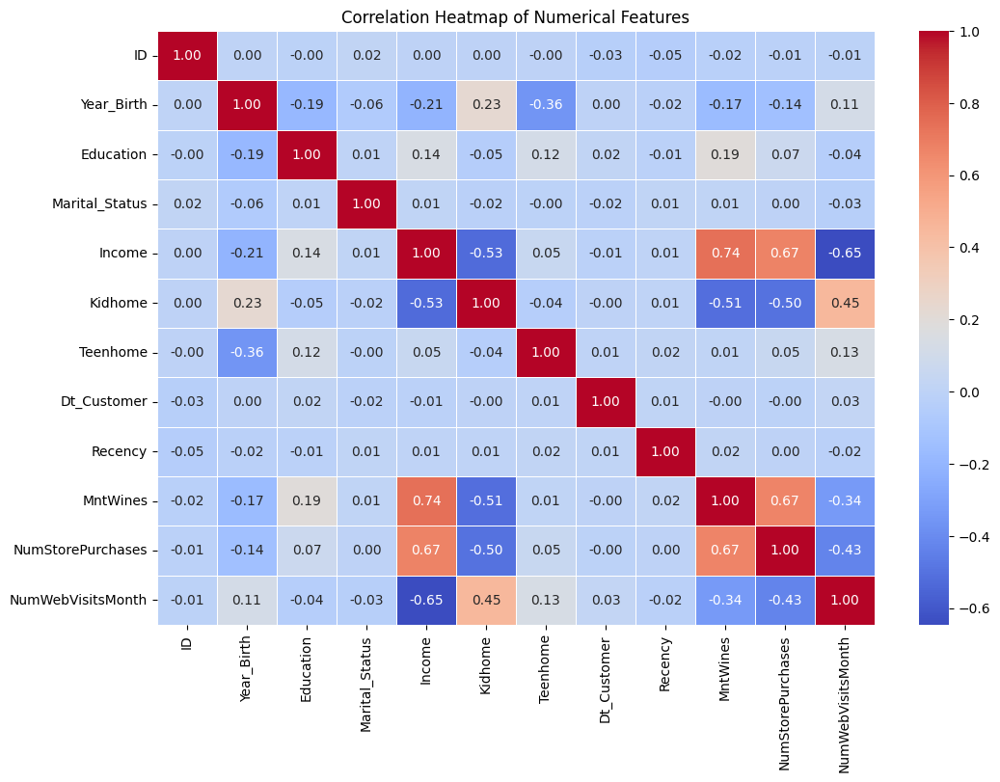

In [75]:
plt.figure(figsize=(12, 8))
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

Assigning columns with high variance to numerical_columns variable so that I can use it later on for my analyses

In [77]:
numerical_columns = ['Income', 'Recency', 'MntWines', 'NumStorePurchases', 'NumWebVisitsMonth']

Lets say I dont know the optimal k for my clustering, so I will go with k=4 just to show how my clustering algorithm works with my dataset, and I will go for K-means. I do not use any dimension reduction method here, it will come later on. So below you can see the result...

Cluster Centers:
[[-0.65132403  0.87324624 -0.68296081 -0.66124347  0.40875377]
 [ 0.90259215  0.81659719  0.95805123  0.88286525 -0.6217926 ]
 [ 0.87754247 -0.92974713  0.74618727  0.8086739  -0.61318571]
 [-0.81270422 -0.82598218 -0.72573454 -0.73220589  0.60600675]]


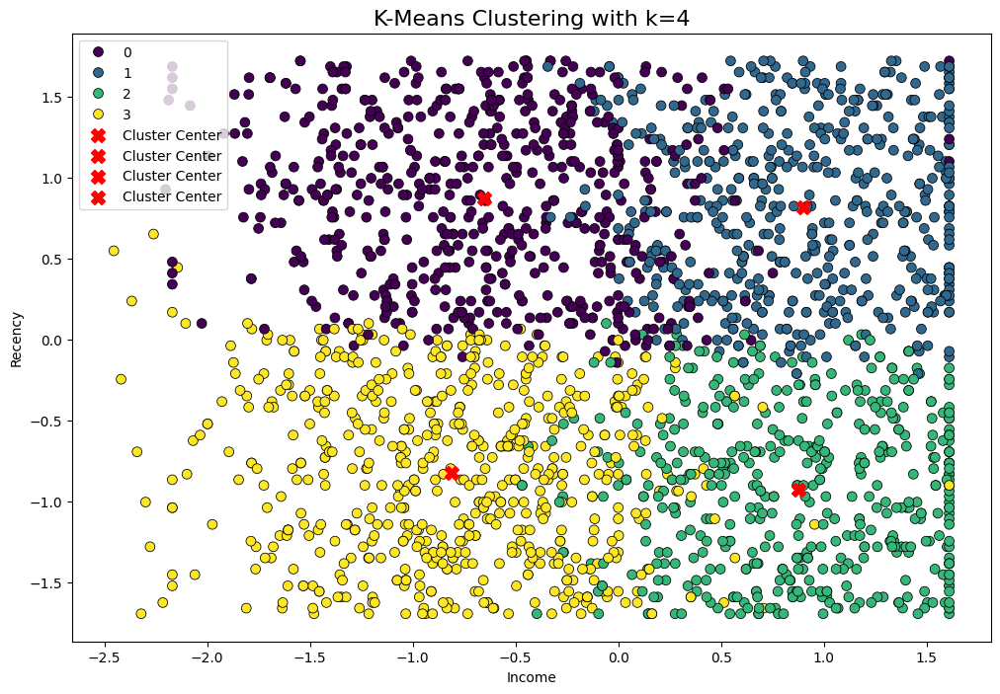

Cluster
3    619
0    610
1    526
2    485
Name: count, dtype: int64


In [79]:
k = 4 
plt.figure(figsize=(12, 8))
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[numerical_columns])
df['Cluster'] = df['Cluster'].astype(int)
print("Cluster Centers:")
print(kmeans.cluster_centers_)
sns.scatterplot(x='Income', y='Recency', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
centers = kmeans.cluster_centers_
for center in centers:
    plt.scatter(center[0], center[1], c='red', s=100, marker='X', label='Cluster Center')
plt.title(f'K-Means Clustering with k={k}', fontsize=16)
plt.xlabel('Income')
plt.ylabel('Recency')
plt.legend()
plt.show()
print(df['Cluster'].value_counts())

Below I set k = 2, this is just to show the differences in k numbers before actually applying methods for optimal k

Cluster Centers:
[[-0.72698615 -0.01421037 -0.6956969  -0.68747192  0.51644505]
 [ 0.89821243  0.01755732  0.85955366  0.84939146 -0.6380828 ]]


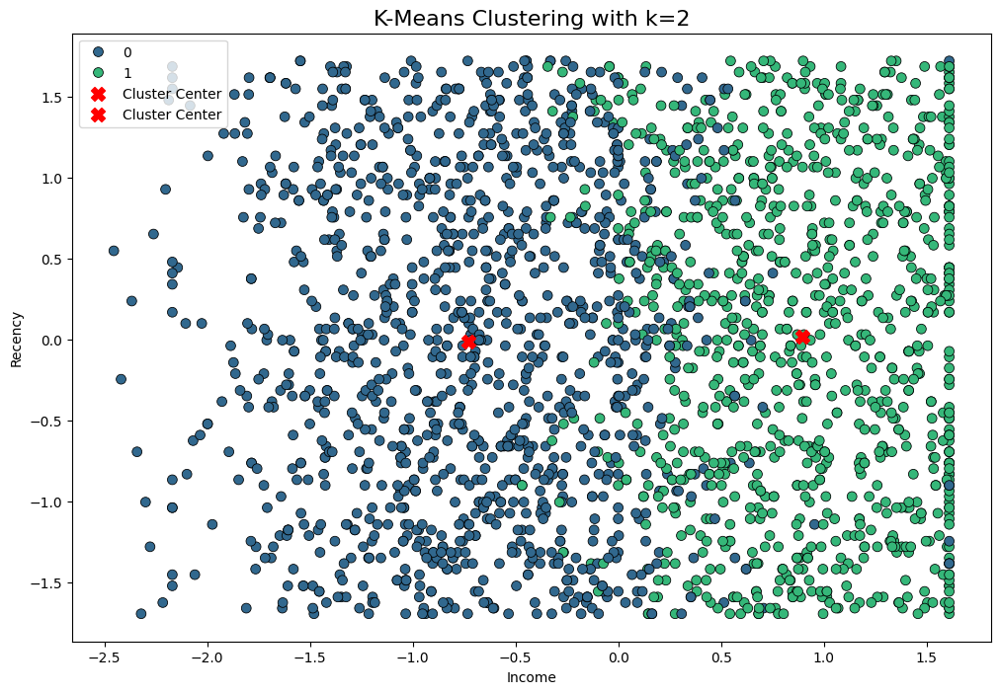

Cluster
0    1237
1    1003
Name: count, dtype: int64


In [81]:
k = 2
plt.figure(figsize=(12, 8))
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[numerical_columns])
df['Cluster'] = df['Cluster'].astype(int)
print("Cluster Centers:")
print(kmeans.cluster_centers_)
sns.scatterplot(x='Income', y='Recency', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
centers = kmeans.cluster_centers_
for center in centers:
    plt.scatter(center[0], center[1], c='red', s=100, marker='X', label='Cluster Center')
plt.title(f'K-Means Clustering with k={k}', fontsize=16)
plt.xlabel('Income')
plt.ylabel('Recency')
plt.legend()
plt.show()
print(df['Cluster'].value_counts())

Cluster Centers:
[[-0.72698615 -0.01421037 -0.6956969  -0.68747192  0.51644505]
 [ 0.89821243  0.01755732  0.85955366  0.84939146 -0.6380828 ]]


C:\Users\khali\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


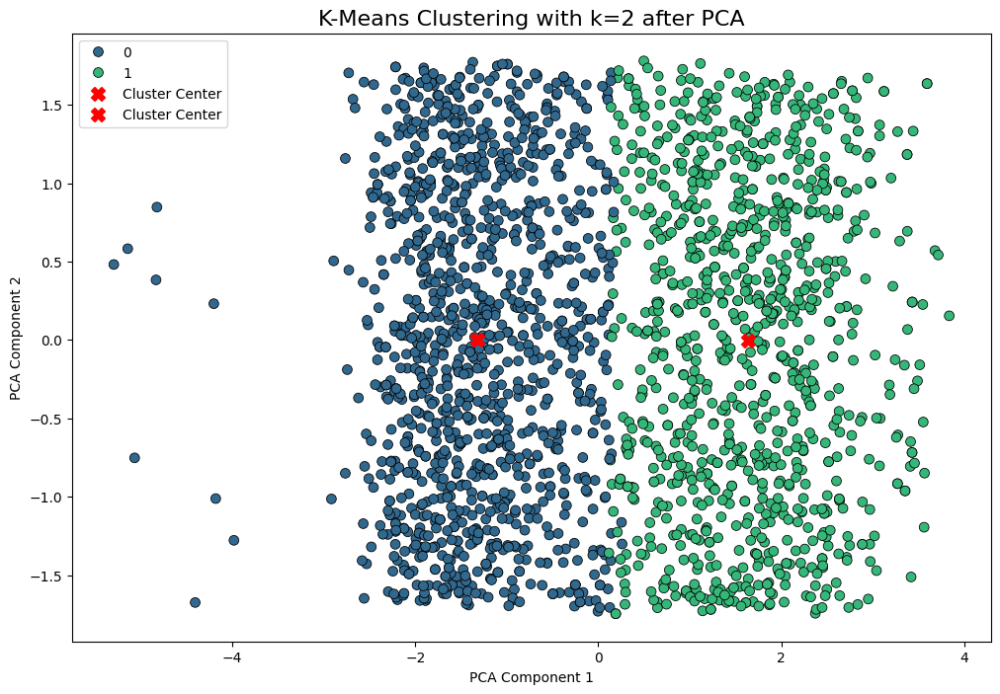

Cluster
0    1237
1    1003
Name: count, dtype: int64


In [83]:
k = 2
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[numerical_columns])
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
df['PCA1'] = pca_components[:, 0]
df['PCA2'] = pca_components[:, 1]
print("Cluster Centers:")
print(kmeans.cluster_centers_)
plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
centers = kmeans.cluster_centers_
pca_centers = pca.transform(centers)
for center in pca_centers:
    plt.scatter(center[0], center[1], c='red', s=100, marker='X', label='Cluster Center')
plt.title(f'K-Means Clustering with k={k} after PCA', fontsize=16)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()
print(df['Cluster'].value_counts())

Below, I used PCA with 2 components before actually finding the best one, also I randomly selected k = 3

Cluster Centers:
[[-0.78458117  0.00709435 -0.72635128 -0.72659639  0.54264047]
 [ 0.85886358  0.83432495  0.86567955  0.80090257 -0.6088    ]
 [ 0.85357091 -0.95507052  0.71084194  0.78428458 -0.57372441]]


C:\Users\khali\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


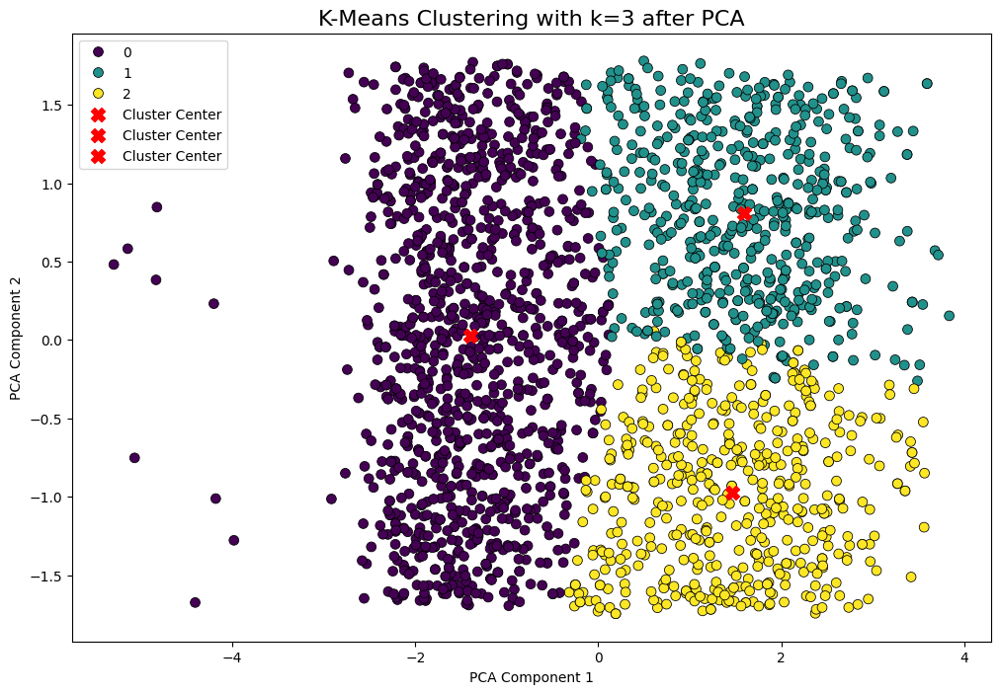

Cluster
0    1169
1     567
2     504
Name: count, dtype: int64


In [85]:
k = 3 
kmeans = KMeans(n_clusters=k, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[numerical_columns])
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
df['PCA1'] = pca_components[:, 0]
df['PCA2'] = pca_components[:, 1]
print("Cluster Centers:")
print(kmeans.cluster_centers_)
plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
centers = kmeans.cluster_centers_
pca_centers = pca.transform(centers)
for center in pca_centers:
    plt.scatter(center[0], center[1], c='red', s=100, marker='X', label='Cluster Center')
plt.title(f'K-Means Clustering with k={k} after PCA', fontsize=16)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()
print(df['Cluster'].value_counts())

To make sure, I need to check one more time

In [87]:
df[numerical_columns].describe()

,Income,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
count,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03,2.240000e+03
mean,4.282289e-17,-3.172066e-18,-5.233909e-17,7.612958e-17,-6.344132e-17
std,9.948505e-01,1.000223e+00,1.000223e+00,1.000223e+00,1.000223e+00
min,-2.454443e+00,-1.696001e+00,-9.399577e-01,-1.781466e+00,-2.191381e+00
25%,-7.865559e-01,-8.671566e-01,-8.643558e-01,-8.584551e-01,-9.548307e-01
50%,4.328667e-17,-3.777284e-03,-3.876659e-01,-2.431145e-01,2.817201e-01
75%,8.291494e-01,8.596020e-01,6.651903e-01,6.798964e-01,6.939037e-01
max,1.610596e+00,1.722981e+00,2.243281e+00,2.218248e+00,6.052291e+00


In [154]:
# sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=df['Cluster'], palette="Set1", s=100, edgecolor='black')

### Statistical Summary for each cluster

In [89]:
for cluster_num in range(k):
    print(f"Statistical Summary for Cluster {cluster_num}:")
    cluster_data = df[df['Cluster'] == cluster_num]
    display(cluster_data[numerical_columns].describe())
    print("\n")

Statistical Summary for Cluster 0:


,Income,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
count,1169.000000,1169.000000,1169.000000,1169.000000,1169.000000
mean,-0.784581,0.007094,-0.726351,-0.726596,0.542640
std,0.596480,0.978229,0.297804,0.392027,0.766543
min,-2.454443,-1.696001,-0.939958,-1.781466,-2.191381
25%,-1.210067,-0.832621,-0.911309,-0.858455,0.281720
50%,-0.760101,-0.003777,-0.857194,-0.858455,0.693904
75%,-0.344323,0.859602,-0.678932,-0.550785,1.106087
max,0.752005,1.722981,1.135514,0.987567,6.052291




Statistical Summary for Cluster 1:


,Income,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
count,567.000000,567.000000,567.000000,567.000000,567.000000
mean,0.858864,0.834325,0.865680,0.800903,-0.608800
std,0.519505,0.520676,0.876689,0.850128,0.873583
min,-0.343040,-0.210988,-0.936775,-1.781466,-2.191381
25%,0.467205,0.376110,0.198050,0.064556,-1.367014
50%,0.854568,0.825067,0.775808,0.679896,-0.542647
75%,1.308728,1.308559,1.577984,1.602907,0.281720
max,1.610596,1.722981,2.243281,2.218248,1.518271




Statistical Summary for Cluster 2:


,Income,Recency,MntWines,NumStorePurchases,NumWebVisitsMonth
count,504.000000,504.000000,504.000000,504.000000,504.000000
mean,0.853571,-0.955071,0.710842,0.784285,-0.573724
std,0.532509,0.476868,0.897387,0.846654,0.893410
min,-1.034047,-1.696001,-0.936775,-1.781466,-2.191381
25%,0.465910,-1.385184,-0.049447,0.064556,-1.367014
50%,0.875387,-0.936227,0.605505,0.679896,-0.542647
75%,1.328029,-0.590875,1.404497,1.295237,0.281720
max,1.610596,0.030758,2.243281,2.218248,1.518271


### Warming Up Time :) This is where it begins

In [91]:
silhouette_avg = silhouette_score(df[numerical_columns], df['Cluster'])
print(f"Silhouette Score: {silhouette_avg:.4f}")

Silhouette Score: 0.3176


In [93]:
db_score = davies_bouldin_score(df[numerical_columns], df['Cluster'])
print(f"Davies-Bouldin Index: {db_score:.4f}")

Davies-Bouldin Index: 1.5265


In [95]:
ch_score = calinski_harabasz_score(df[numerical_columns], df['Cluster'])
print(f"Calinski-Harabasz Score: {ch_score:.4f}")

Calinski-Harabasz Score: 1150.5784


Below, I evaluate the performance of K-Means clustering by testing it with different values of k. Specifically, I experiment with k=4, k=6, and k=7 to identify the optimal number of clusters that best represent the underlying structure of the data.

For each value of k, I initialize the K-Means algorithm using the k-means++ initialization method. This technique helps improve the convergence speed and avoids poor clustering outcomes by smartly selecting initial cluster centroids.
  
To evaluate the quality of the clustering, I compute the Silhouette Score for each value of k. The Silhouette Score measures how well-separated the clusters are. A higher score indicates better-defined and well-separated clusters.
  
I plot the clusters in the 2D PCA-reduced space, with data points colored according to their cluster assignments. This visualization helps in assessing the clustering results intuitively. Additionally, I mark the cluster centers with red X markers to highlight their positions.

After fitting the K-Means model for each k, I print the coordinates of the cluster centers. These centers provide insights into the representative points for each cluster.

The KMeans++ initialization minimizes the chances of poor convergence by carefully selecting initial centroids. This ensures more consistent and accurate clustering results.
Using the PCA-reduced data for clustering simplifies the problem and reduces noise, enabling the algorithm to focus on the most significant features of the data.


Silhouette Score for k=4: 0.2451465878573038


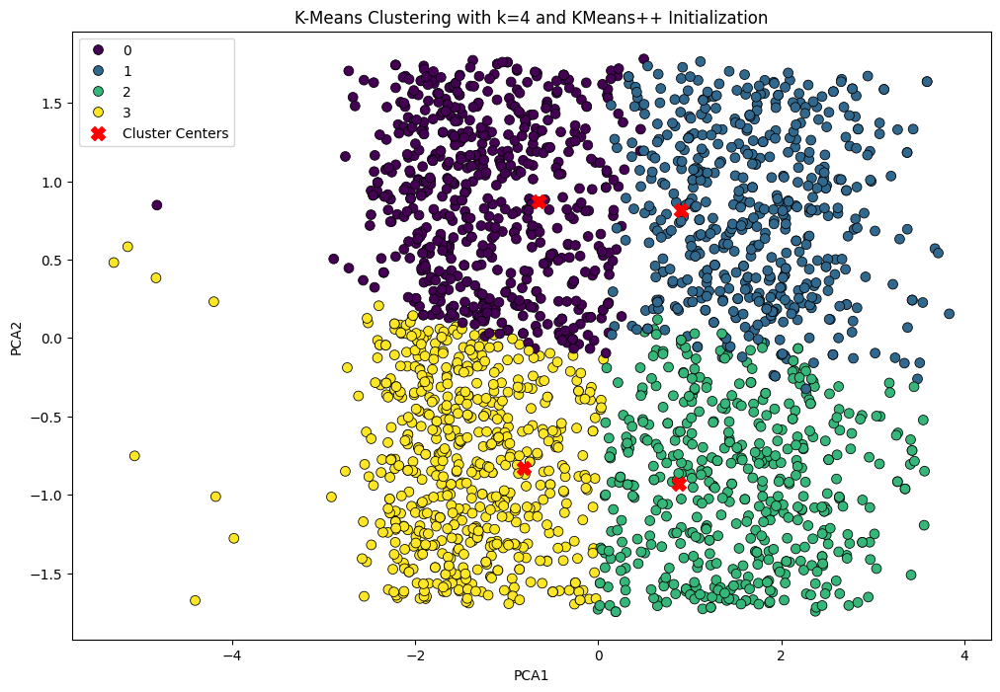

Cluster Centers for k=4:
[[-0.65132403  0.87324624 -0.68296081 -0.66124347  0.40875377]
 [ 0.90259215  0.81659719  0.95805123  0.88286525 -0.6217926 ]
 [ 0.87754247 -0.92974713  0.74618727  0.8086739  -0.61318571]
 [-0.81270422 -0.82598218 -0.72573454 -0.73220589  0.60600675]]
Silhouette Score for k=6: 0.23429283429407805


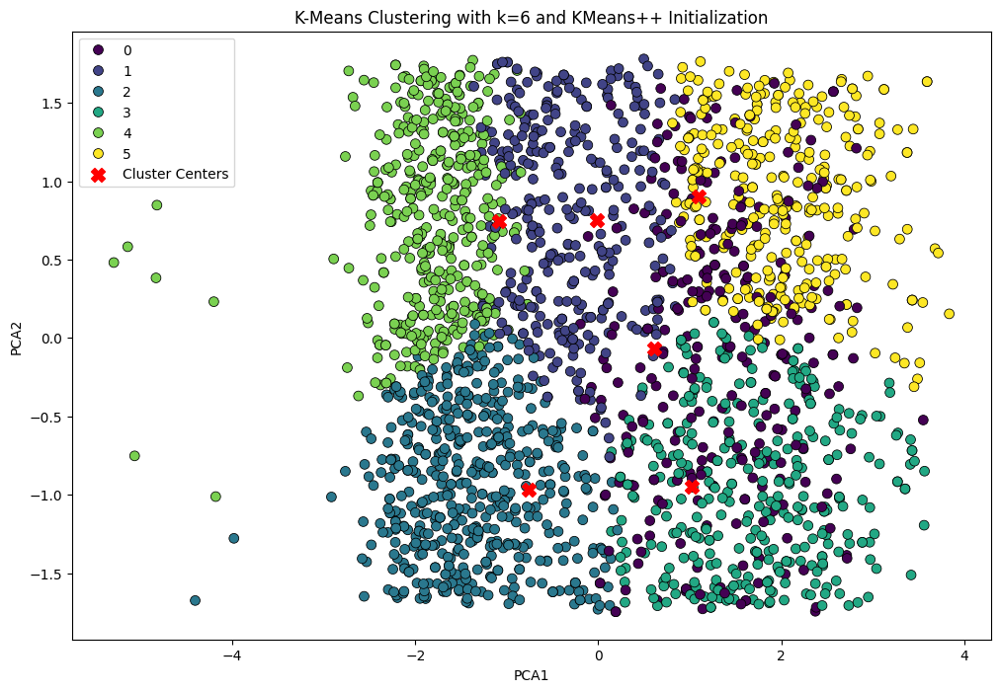

Cluster Centers for k=6:
[[ 0.60830119 -0.06620625  1.38774644  0.98433943  0.47051752]
 [-0.01204363  0.75254298 -0.40938906 -0.2981222  -0.11297689]
 [-0.76073472 -0.96656624 -0.7164825  -0.70318223  0.51131025]
 [ 1.01796055 -0.94916488  0.56501919  0.77791529 -1.06912348]
 [-1.08677585  0.74602508 -0.82768507 -0.85484394  0.85645502]
 [ 1.09528153  0.90021282  0.87214006  0.90590117 -1.15201728]]
Silhouette Score for k=7: 0.22850368623120176


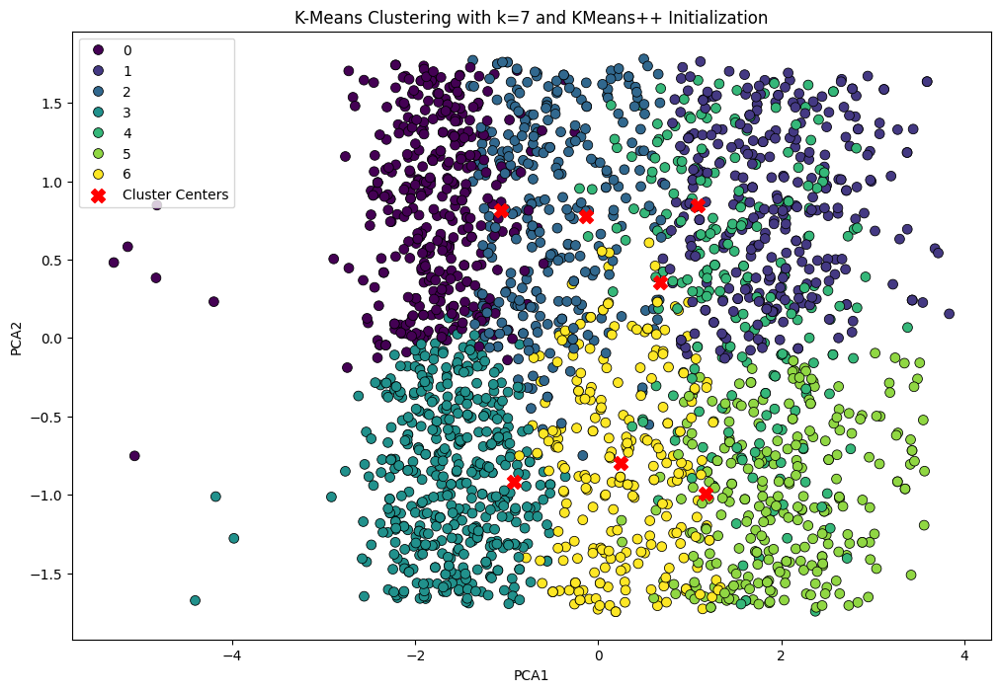

Cluster Centers for k=7:
[[-1.05946755  0.81652206 -0.79974758 -0.83625208  0.91168116]
 [ 1.08019567  0.84714312  0.73849541  0.81815335 -1.23396768]
 [-0.12965731  0.77733717 -0.57482654 -0.45776819 -0.25233836]
 [-0.92187777 -0.91947152 -0.80547941 -0.82651475  0.57863205]
 [ 0.67464296  0.35389819  1.55885805  1.04373891  0.38775907]
 [ 1.16927693 -0.99546609  0.85922259  0.91682503 -1.13685337]
 [ 0.24562059 -0.79446562  0.07675323  0.36726371  0.23019718]]


In [97]:
k_values = [4, 6, 7]
for k in k_values:
    plt.figure(figsize=(12, 8))
    kmeans = KMeans(n_clusters=k, random_state=42, init='k-means++', n_init=10)
    df['Cluster'] = kmeans.fit_predict(df[numerical_columns])
    silhouette_avg = silhouette_score(df[numerical_columns], df['Cluster'])
    print(f"Silhouette Score for k={k}: {silhouette_avg}")
    sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, marker='X', label='Cluster Centers')
    plt.title(f'K-Means Clustering with k={k} and KMeans++ Initialization')
    plt.xlabel('PCA1')
    plt.ylabel('PCA2')
    plt.legend()
    plt.show()
    print(f"Cluster Centers for k={k}:")
    print(kmeans.cluster_centers_)

In this section, I use the DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm to cluster the dataset and identify potential patterns. DBSCAN is particularly effective for datasets with noise and irregularly shaped clusters.

DBSCAN requires two key parameters: eps (the maximum distance between two samples to be considered neighbors) and min_samples (the minimum number of points required to form a dense region).
I explore a range of values for eps (from 0.1 to 2.0 in 20 steps) and for min_samples (from 3 to 6). This grid search helps identify the best combination of parameters for clustering.

For each combination of eps and min_samples, I calculate the Silhouette Score. This metric evaluates how well clusters are separated from each other. To avoid selecting meaningless clusters, I ensure that the number of unique clusters is greater than 1.

The combination of eps and min_samples that yields the highest Silhouette Score is selected as the optimal parameter set for DBSCAN. The best eps and min_samples values, along with the corresponding best Silhouette Score, are printed.

Using the best eps and min_samples values, I fit the DBSCAN model to the data and assign cluster labels to each data point.


In [99]:
from sklearn.cluster import DBSCAN
scaled_data = df[numerical_columns]
best_score = -1
best_eps = None
best_min_samples = None
eps_values = np.linspace(0.1, 2.0, 20) 
min_samples_values = [3, 4, 5, 6] 
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        clusters = dbscan.fit_predict(scaled_data)
        if len(set(clusters)) > 1:
            score = silhouette_score(scaled_data, clusters)
            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples
print(f"Best DBSCAN parameters: eps={best_eps}, min_samples={best_min_samples}")
print(f"Best Silhouette Score: {best_score}")

Best DBSCAN parameters: eps=1.7, min_samples=4
Best Silhouette Score: 0.5669651538715308


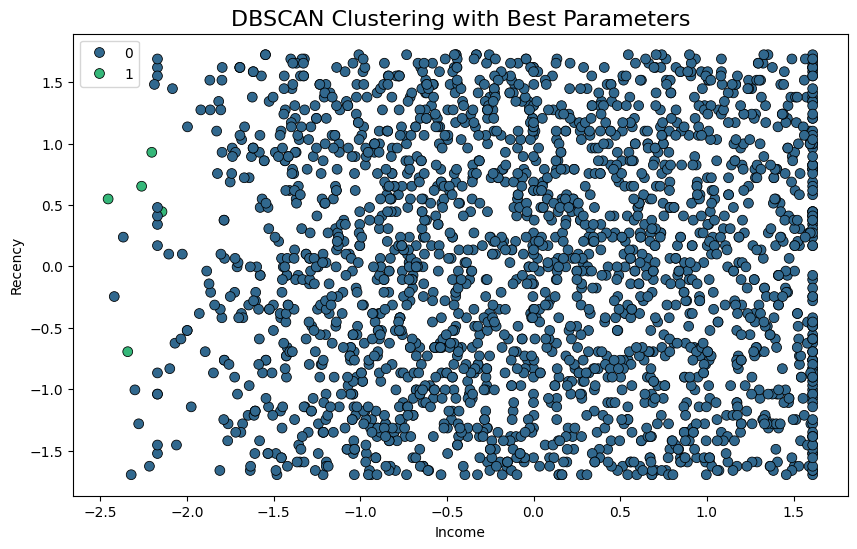

In [101]:
best_dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
df['Cluster'] = best_dbscan.fit_predict(scaled_data)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Income', y='Recency', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
noise_points = df[df['Cluster'] == -1]
sns.scatterplot(x=noise_points['Income'], y=noise_points['Recency'], color='red', label='Noise', s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering with Best Parameters', fontsize=16)
plt.xlabel('Income')
plt.ylabel('Recency')
plt.legend()
plt.show()

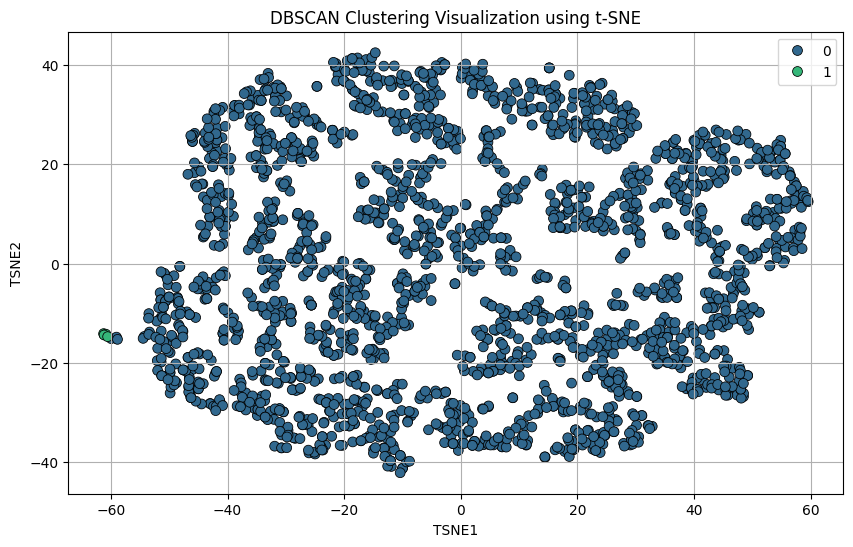

In [103]:
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(scaled_data)
df['TSNE1'] = tsne_components[:, 0]
df['TSNE2'] = tsne_components[:, 1]
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='Cluster', palette='viridis', data=df, s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering Visualization using t-SNE')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')
plt.legend()
plt.grid(True)
plt.show()

Hopkins Statistic: 1.0


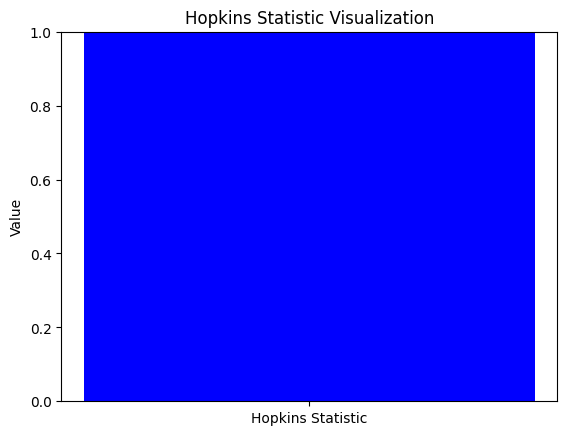

In [105]:
def hopkins_statistic(X):
    d = X.shape[1]
    n = len(X)
    m = int(0.1 * n)
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
    uj = 0.0
    wj = 0.0
    for j in range(m):
        u_dist, _ = nbrs.kneighbors(np.random.uniform(X.min(), X.max(), (1, d)), return_distance=True)
        uj += u_dist[0][0]
        w_dist, _ = nbrs.kneighbors(X.loc[[np.random.choice(X.index)], :].values, return_distance=True)
        wj += w_dist[0][0]
    H = uj / (uj + wj)
    return H
hopkins_stat = hopkins_statistic(df[numerical_columns])
print("Hopkins Statistic:", hopkins_stat)
plt.bar('Hopkins Statistic', hopkins_stat, color='blue')
plt.ylim(0, 1)
plt.ylabel('Value')
plt.title('Hopkins Statistic Visualization')
plt.show()

it was annoying to see such warnings so can be pretty useful

In [107]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning, message=".*KMeans is known to have a memory leak.*")

#### Elbow Method for Optimal Number of Clusters

In this analysis, I used the Elbow Method to determine the optimal number of clusters for the K-Means algorithm. The inertia values (sum of squared distances of samples to their closest cluster center) for different values of k.

As you can observe, the inertia decreases with the increase in the number of clusters. The rate of decrease slows down after k=4, which suggests that k=4 might be the optimal number of clusters. This is where the "elbow" of the inertia curve occurs, indicating that adding more clusters beyond this point doesn't significantly improve the model.

Thus, the optimal value of k = 4 for clustering.

Inertia for 2 clusters: 6327.06438620347
Inertia for 3 clusters: 5509.001391679189
Inertia for 4 clusters: 4644.808335382515
Inertia for 5 clusters: 4144.710597209691
Inertia for 6 clusters: 3849.2933359576427
Inertia for 7 clusters: 3559.950113305847
Inertia for 8 clusters: 3346.4751597584923
Inertia for 9 clusters: 3163.6551379925827
Inertia for 10 clusters: 3040.207429185415


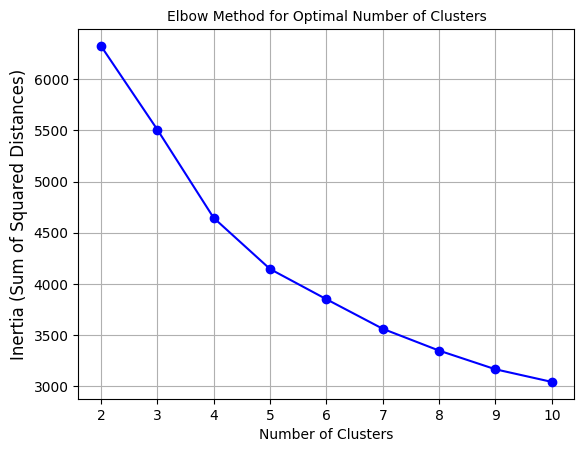

In [109]:
range_n_clusters = list(range(2, 11))
inertia_values = []
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(scaled_data)
    inertia_values.append(kmeans.inertia_)
    print(f'Inertia for {n_clusters} clusters: {kmeans.inertia_}')
plt.plot(range_n_clusters, inertia_values, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters', fontsize=10)
plt.xlabel('Number of Clusters', fontsize=10)
plt.ylabel('Inertia (Sum of Squared Distances)', fontsize=12)
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

In [111]:
cluster_counts = df['Cluster'].value_counts()
print("Cluster Size Distribution:\n", cluster_counts)

Cluster Size Distribution:
 Cluster
0    2235
1       5
Name: count, dtype: int64


In this analysis, I performed a Silhouette Analysis to determine the optimal number of clusters for the K-Means clustering algorithm. The Silhouette Score measures how similar a data point is to its own cluster compared to other clusters, with values ranging from -1 (poor clustering) to 1 (ideal clustering).

Silhouette Score for 2 clusters: 0.3842
Silhouette Score for 3 clusters: 0.3176
Silhouette Score for 4 clusters: 0.2451
Silhouette Score for 5 clusters: 0.2516
Silhouette Score for 6 clusters: 0.2460
Silhouette Score for 7 clusters: 0.2277
Silhouette Score for 8 clusters: 0.2286
Silhouette Score for 9 clusters: 0.2149
Silhouette Score for 10 clusters: 0.1979


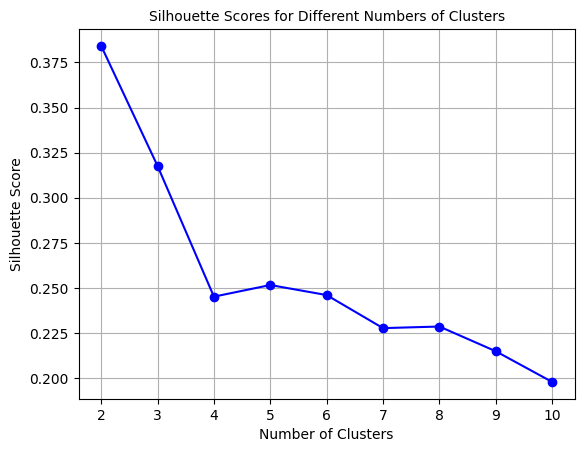

In [113]:
X = df[numerical_columns].values
range_n_clusters = list(range(2, 11))
sil_scores = []
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    score = silhouette_score(X, cluster_labels)
    sil_scores.append(score)
    print(f"Silhouette Score for {n_clusters} clusters: {score:.4f}")
plt.plot(range_n_clusters, sil_scores, marker='o', linestyle='-', color='b')
plt.title('Silhouette Scores for Different Numbers of Clusters', fontsize=10)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range_n_clusters)
plt.grid(True)

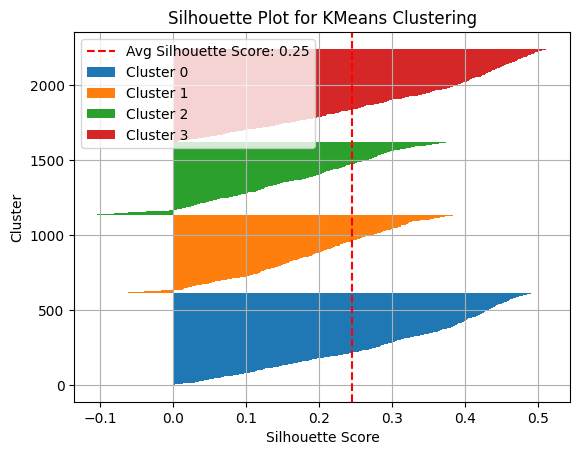

Cluster 0 - Min Silhouette Score: -0.0136, Max Silhouette Score: 0.4904, Mean Silhouette Score: 0.2919
Cluster 1 - Min Silhouette Score: -0.0937, Max Silhouette Score: 0.4044, Mean Silhouette Score: 0.1882
Cluster 2 - Min Silhouette Score: -0.1043, Max Silhouette Score: 0.3976, Mean Silhouette Score: 0.1711
Cluster 3 - Min Silhouette Score: 0.0044, Max Silhouette Score: 0.5141, Mean Silhouette Score: 0.3055


In [115]:
k = 4
from sklearn.metrics import silhouette_samples, silhouette_score
kmeans = KMeans(n_clusters=k, random_state=42)
cluster_labels = kmeans.fit_predict(X)
silhouette_vals = silhouette_samples(X, cluster_labels)
y_lower, y_upper = 0, 0
for i in range(k):
    cluster_silhouette_vals = silhouette_vals[cluster_labels == i]
    cluster_silhouette_vals.sort()
    y_upper += len(cluster_silhouette_vals)
    plt.barh(range(y_lower, y_upper), cluster_silhouette_vals, height=1.0, label=f'Cluster {i}')
    y_lower = y_upper
avg_score = silhouette_score(X, cluster_labels)
plt.axvline(avg_score, color="red", linestyle="--", label=f'Avg Silhouette Score: {avg_score:.2f}')
plt.title('Silhouette Plot for KMeans Clustering', fontsize=12)
plt.xlabel('Silhouette Score')
plt.ylabel('Cluster')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()
for i in range(k): 
    cluster_silhouette_vals = silhouette_vals[cluster_labels == i]
    print(f"Cluster {i} - Min Silhouette Score: {cluster_silhouette_vals.min():.4f}, "
          f"Max Silhouette Score: {cluster_silhouette_vals.max():.4f}, "
          f"Mean Silhouette Score: {cluster_silhouette_vals.mean():.4f}")

Silhouette Score: 0.3950


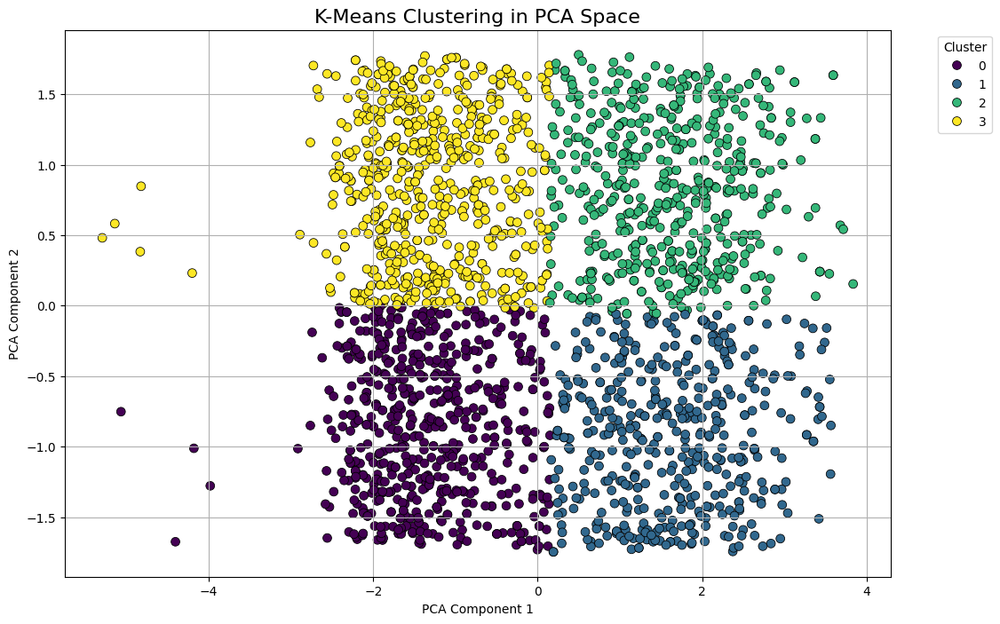

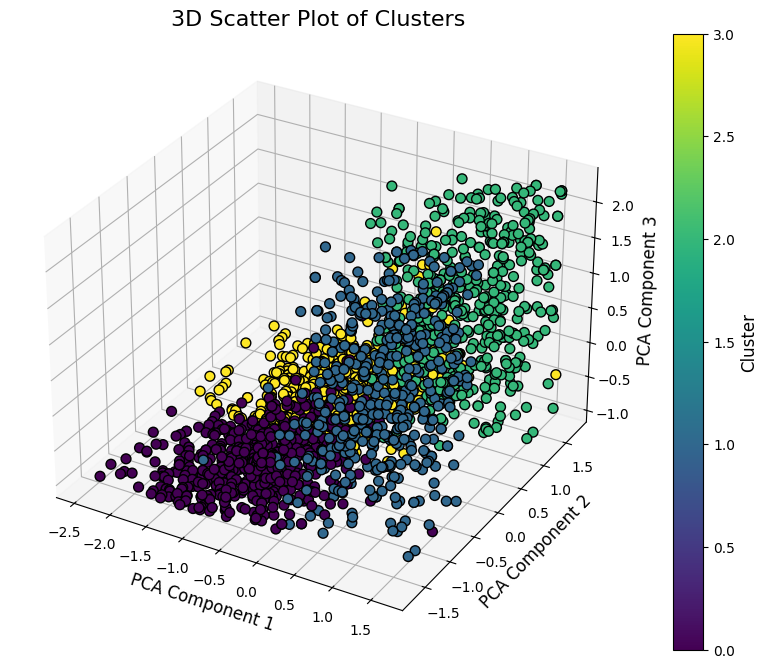

In [127]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
kmeans = KMeans(n_clusters=4, random_state=42)
df['Cluster'] = kmeans.fit_predict(pca_components)
silhouette_avg = silhouette_score(pca_components, df['Cluster'])
print(f"Silhouette Score: {silhouette_avg:.4f}")
plt.figure(figsize=(12, 8))
sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=df['Cluster'], palette='viridis', s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering in PCA Space', fontsize=16)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['Income'], df['Recency'], df['MntWines'],
                     c=df['Cluster'], cmap='viridis', s=50, edgecolor='k', alpha=1.0)
ax.set_xlabel('PCA Component 1', fontsize=12)
ax.set_ylabel('PCA Component 2', fontsize=12)
ax.set_zlabel('PCA Component 3', fontsize=12)
ax.set_title('3D Scatter Plot of Clusters', fontsize=16)
cbar = plt.colorbar(scatter)
cbar.set_label('Cluster', fontsize=12)
plt.show()

GMM Silhouette Score: 0.3949
DBSCAN Silhouette Score: 0.4558


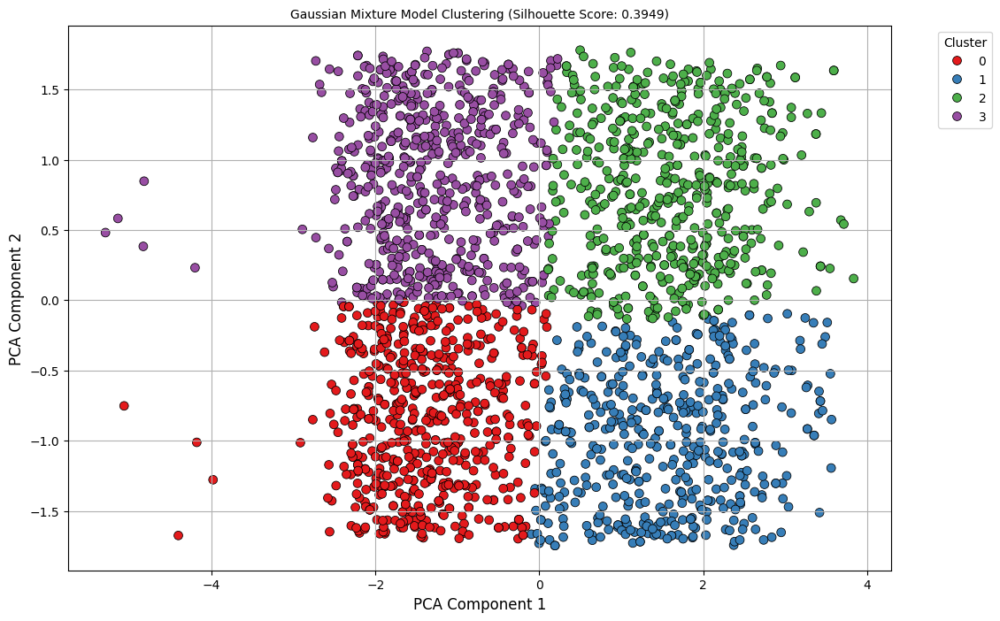

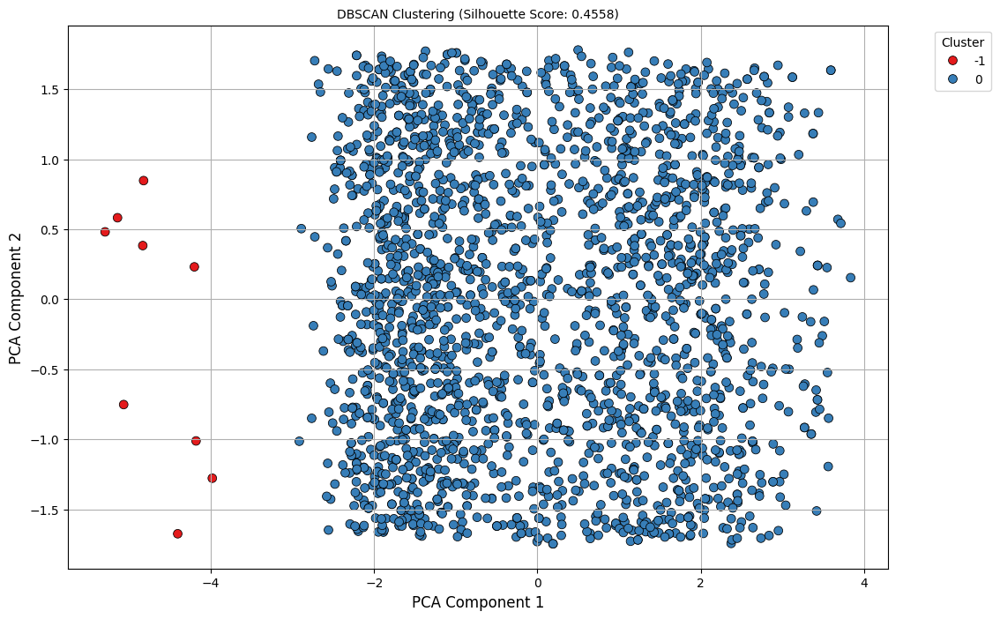

GMM Clustering Results:
GMM_Cluster
3    627
0    583
2    552
1    478
Name: count, dtype: int64


DBSCAN Clustering Results:
DBSCAN_Cluster
 0    2231
-1       9
Name: count, dtype: int64




In [119]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
gmm = GaussianMixture(n_components=4, random_state=42)
gmm_labels = gmm.fit_predict(pca_components)
df['GMM_Cluster'] = gmm_labels
gmm_silhouette = silhouette_score(pca_components, gmm_labels)
print(f"GMM Silhouette Score: {gmm_silhouette:.4f}")
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(pca_components)
df['DBSCAN_Cluster'] = dbscan_labels
dbscan_silhouette = silhouette_score(pca_components, dbscan_labels) if len(set(dbscan_labels)) > 1 else -1
print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.4f}")
def plot_clustering_result(X, labels, title):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='Set1', s=50, alpha=1.0, edgecolor='black')
    plt.title(title, fontsize=10)
    plt.xlabel('PCA Component 1', fontsize=12)
    plt.ylabel('PCA Component 2', fontsize=12)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()
plot_clustering_result(pca_components, df['GMM_Cluster'], f'Gaussian Mixture Model Clustering (Silhouette Score: {gmm_silhouette:.4f})')
plot_clustering_result(pca_components, df['DBSCAN_Cluster'], f'DBSCAN Clustering (Silhouette Score: {dbscan_silhouette:.4f})')
print("GMM Clustering Results:")
print(df['GMM_Cluster'].value_counts())
print("\n")
print("DBSCAN Clustering Results:")
print(df['DBSCAN_Cluster'].value_counts())
print("\n")

Hierarchical Clustering Silhouette Score: 0.3148


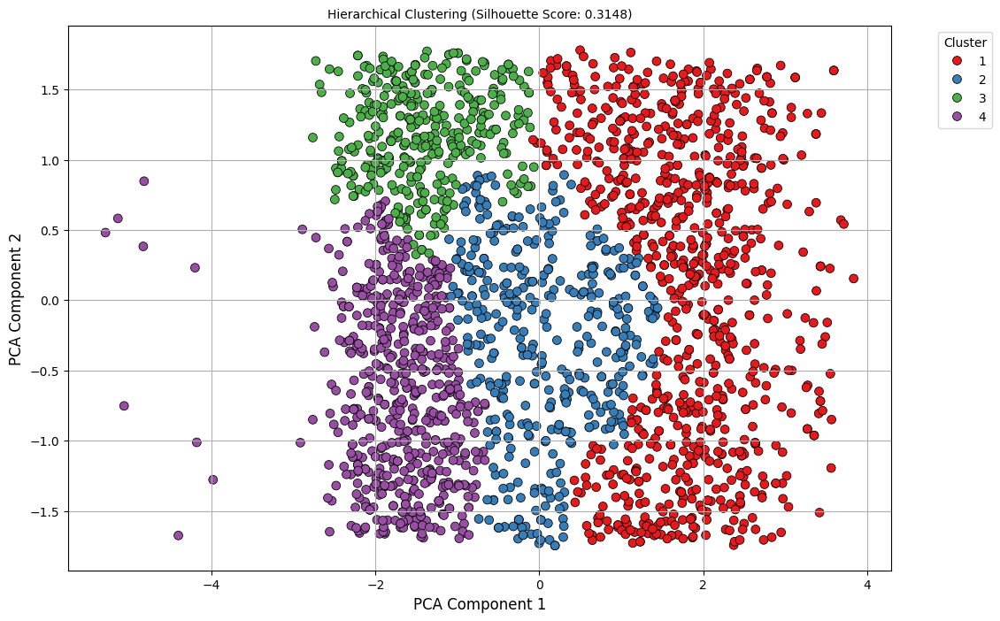

In [121]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
Z = linkage(pca_components, method='ward')
hierarchical_labels = fcluster(Z, t=4, criterion='maxclust')
df['Hierarchical_Cluster'] = hierarchical_labels
silhouette_avg = silhouette_score(pca_components, hierarchical_labels)
print(f"Hierarchical Clustering Silhouette Score: {silhouette_avg:.4f}")
def plot_clustering_result(X, labels, title):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='Set1', s=50, alpha=1.0, edgecolor='black')
    plt.title(title, fontsize=10)
    plt.xlabel('PCA Component 1', fontsize=12)
    plt.ylabel('PCA Component 2', fontsize=12)
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.show()
plot_clustering_result(pca_components, df['Hierarchical_Cluster'], f'Hierarchical Clustering (Silhouette Score: {silhouette_avg:.4f})')


#### Clustering Algorithm Performance Comparison

After applying various clustering algorithms to the dataset, I calculated the Silhouette Scores for each method to evaluate their performance. Below are the results:

- K-Means with PCA: Silhouette Score = 0.3950
- Gaussian Mixture Model (GMM): Silhouette Score = 0.3949
- DBSCAN: Silhouette Score = 0.4558
- Hierarchical Clustering: Silhouette Score = 0.3148

##### Observations:
- DBSCAN achieved the highest Silhouette Score (0.4558), indicating the best clustering performance among the methods tested.
- K-Means with PCA and GMM performed similarly, with scores of 0.3950 and 0.3949, respectively.
- Hierarchical Clustering had the lowest Silhouette Score (0.3148), suggesting less effective clustering compared to the other methods.

These results highlight the importance of testing multiple clustering algorithms to identify the best fit for the dataset.

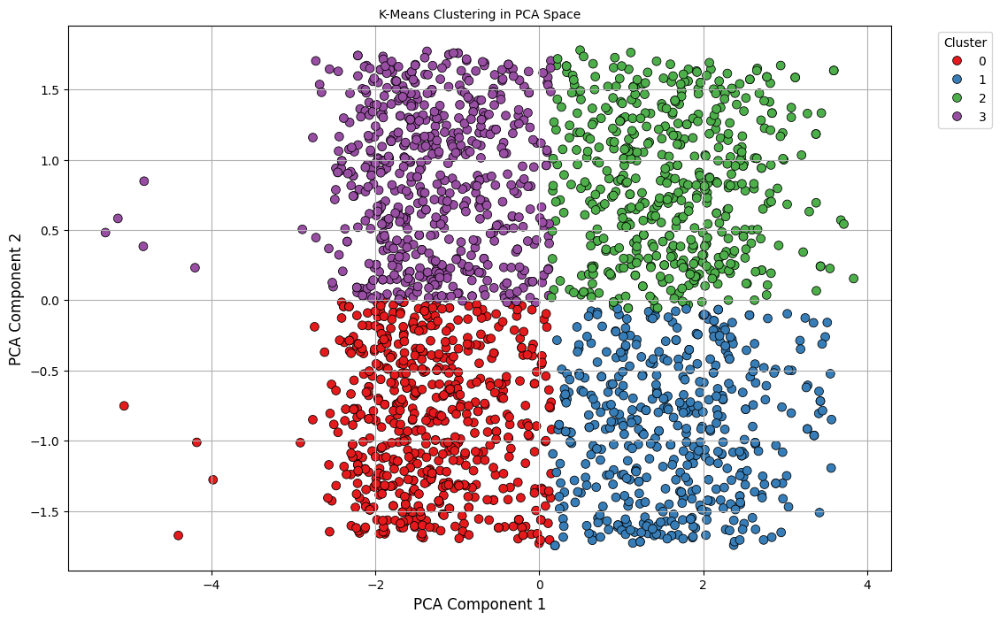

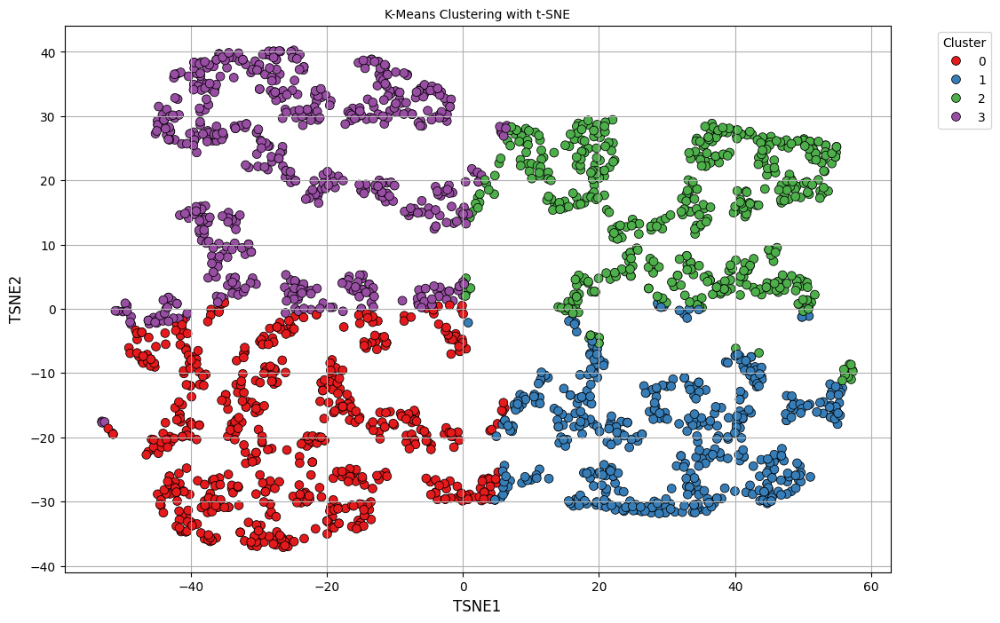

C:\Users\khali\AppData\Local\Temp\ipykernel_3108\1532454869.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=np.arange(1, len(pca.explained_variance_ratio_) + 1), y=pca.explained_variance_ratio_, palette='Blues_d')


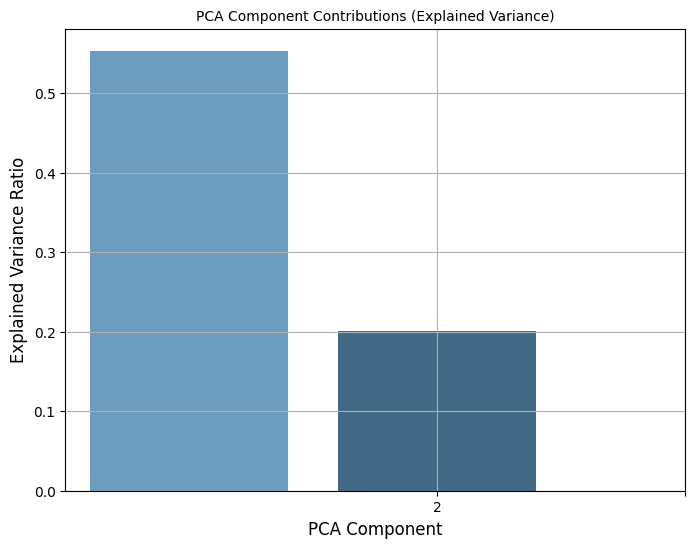

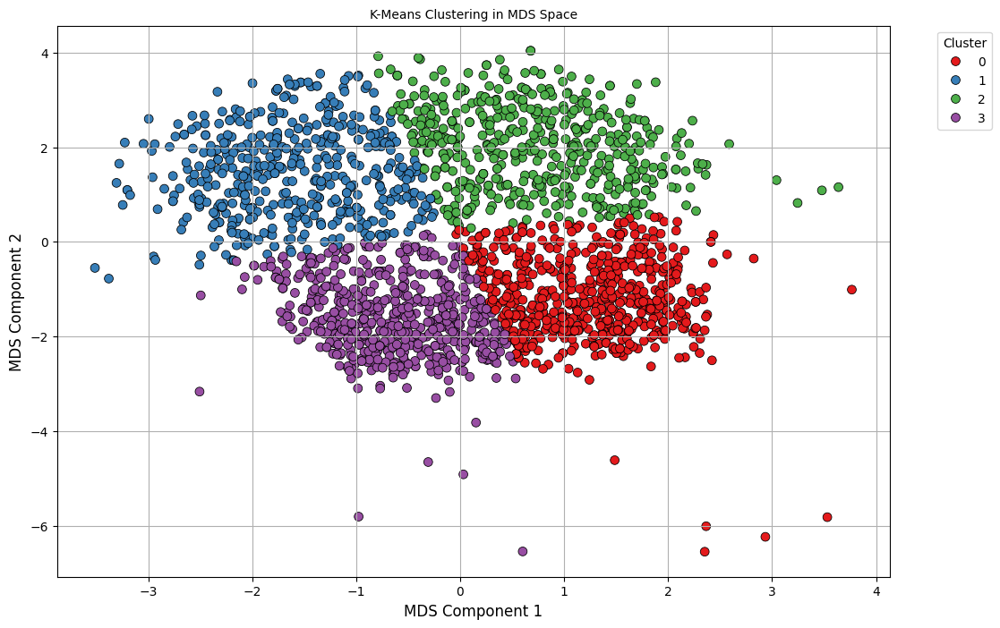

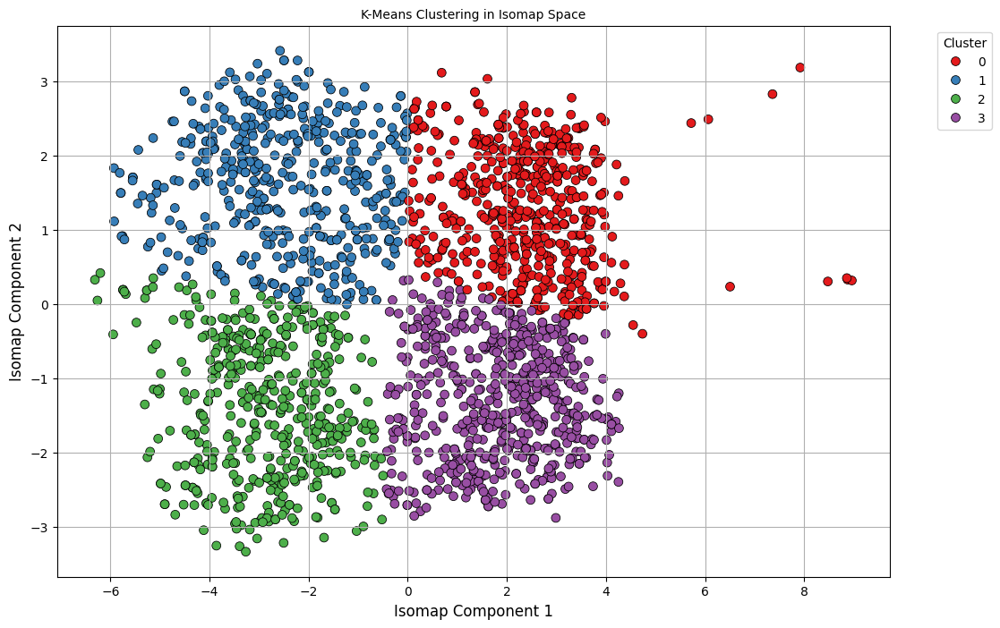

In [125]:
from sklearn.manifold import MDS, Isomap
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_labels = kmeans.fit_predict(pca_components)
df['KMeans_Cluster'] = kmeans_labels
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(pca_components)
df['TSNE1'] = tsne_components[:, 0]
df['TSNE2'] = tsne_components[:, 1]
plt.figure(figsize=(12, 8))
sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=kmeans_labels, palette='Set1', s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering in PCA Space', fontsize=10)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='KMeans_Cluster', palette='Set1', data=df, s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering with t-SNE', fontsize=10)
plt.xlabel('TSNE1', fontsize=12)
plt.ylabel('TSNE2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
plt.figure(figsize=(8, 6))
sns.barplot(x=np.arange(1, len(pca.explained_variance_ratio_) + 1), y=pca.explained_variance_ratio_, palette='Blues_d')
plt.title('PCA Component Contributions (Explained Variance)', fontsize=10)
plt.xlabel('PCA Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.xticks(np.arange(1, len(pca.explained_variance_ratio_) + 1))
plt.grid(True)
plt.show()
mds = MDS(n_components=2, random_state=42, dissimilarity='euclidean')
mds_components = mds.fit_transform(df[numerical_columns])
kmeans_mds = KMeans(n_clusters=4, random_state=42)
kmeans_labels_mds = kmeans_mds.fit_predict(mds_components)
df['MDS_Cluster'] = kmeans_labels_mds
isomap = Isomap(n_components=2, n_neighbors=5)
isomap_components = isomap.fit_transform(df[numerical_columns])
kmeans_isomap = KMeans(n_clusters=4, random_state=42)
kmeans_labels_isomap = kmeans_isomap.fit_predict(isomap_components)
df['Isomap_Cluster'] = kmeans_labels_isomap
plt.figure(figsize=(12, 8))
sns.scatterplot(x=mds_components[:, 0], y=mds_components[:, 1], hue=df['MDS_Cluster'], palette='Set1', s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering in MDS Space', fontsize=10)
plt.xlabel('MDS Component 1', fontsize=12)
plt.ylabel('MDS Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
plt.figure(figsize=(12, 8))
sns.scatterplot(x=isomap_components[:, 0], y=isomap_components[:, 1], hue=df['Isomap_Cluster'], palette='Set1', s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering in Isomap Space', fontsize=10)
plt.xlabel('Isomap Component 1', fontsize=12)
plt.ylabel('Isomap Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

Below are the cluster distributions obtained from K-Means clustering applied in PCA, MDS, and Isomap spaces. The number of data points in each cluster is shown for each space.
- The cluster sizes vary slightly across the different dimensionality reduction techniques.
- Isomap Space produced the largest cluster (Cluster 3 with 659 data points), while PCA Space resulted in a relatively balanced distribution.
- These results highlight how the choice of dimensionality reduction impacts the clustering structure.

In [129]:
print("K-Means Clustering Results:")
print(df['KMeans_Cluster'].value_counts())
print("K-Means Clustering Results in MDS Space:")
print(df['MDS_Cluster'].value_counts())
print("K-Means Clustering Results in Isomap Space:")
print(df['Isomap_Cluster'].value_counts())

K-Means Clustering Results:
KMeans_Cluster
3    625
0    611
2    529
1    475
Name: count, dtype: int64
K-Means Clustering Results in MDS Space:
MDS_Cluster
0    641
3    607
2    508
1    484
Name: count, dtype: int64
K-Means Clustering Results in Isomap Space:
Isomap_Cluster
3    659
0    588
2    498
1    495
Name: count, dtype: int64


To evaluate the performance of K-Means clustering, I applied the algorithm in three different reduced-dimensional spaces: PCA, MDS, and Isomap. Below are the results for each space, including Silhouette Scores and Inertia values.
- The Isomap Space achieved the highest Silhouette Score (0.40998), indicating better-defined clusters compared to PCA and MDS.
- The PCA Space had the lowest Inertia (1903.92), suggesting more compact clusters in this space.
- While MDS had slightly lower performance compared to PCA and Isomap, it still provided reasonable clustering results.

These results demonstrate the impact of dimensionality reduction techniques on the effectiveness of K-Means clustering.

In [131]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances_argmin_min
def compute_silhouette_score(X, labels):
    return silhouette_score(X, labels)
def compute_inertia(X, labels, model):
    if hasattr(model, 'inertia_'):
        return model.inertia_
    return None
print("K-Means Clustering in PCA Space - Silhouette Score: ", compute_silhouette_score(pca_components, df['KMeans_Cluster']))
print("K-Means Clustering in PCA Space - Inertia: ", compute_inertia(pca_components, df['KMeans_Cluster'], kmeans))
print("K-Means Clustering in MDS Space - Silhouette Score: ", compute_silhouette_score(mds_components, df['MDS_Cluster']))
print("K-Means Clustering in MDS Space - Inertia: ", compute_inertia(mds_components, df['MDS_Cluster'], kmeans_mds))
print("K-Means Clustering in Isomap Space - Silhouette Score: ", compute_silhouette_score(isomap_components, df['Isomap_Cluster']))
print("K-Means Clustering in Isomap Space - Inertia: ", compute_inertia(isomap_components, df['Isomap_Cluster'], kmeans_isomap))

K-Means Clustering in PCA Space - Silhouette Score:  0.39497336677338524
K-Means Clustering in PCA Space - Inertia:  1903.9215150335883
K-Means Clustering in MDS Space - Silhouette Score:  0.3937239475819243
K-Means Clustering in MDS Space - Inertia:  2647.5153104835435
K-Means Clustering in Isomap Space - Silhouette Score:  0.40998255847639675
K-Means Clustering in Isomap Space - Inertia:  4827.742158319174


#### To evaluate the performance of DBSCAN clustering, I applied the algorithm in four different reduced-dimensional spaces: PCA, t-SNE, MDS, and Isomap.

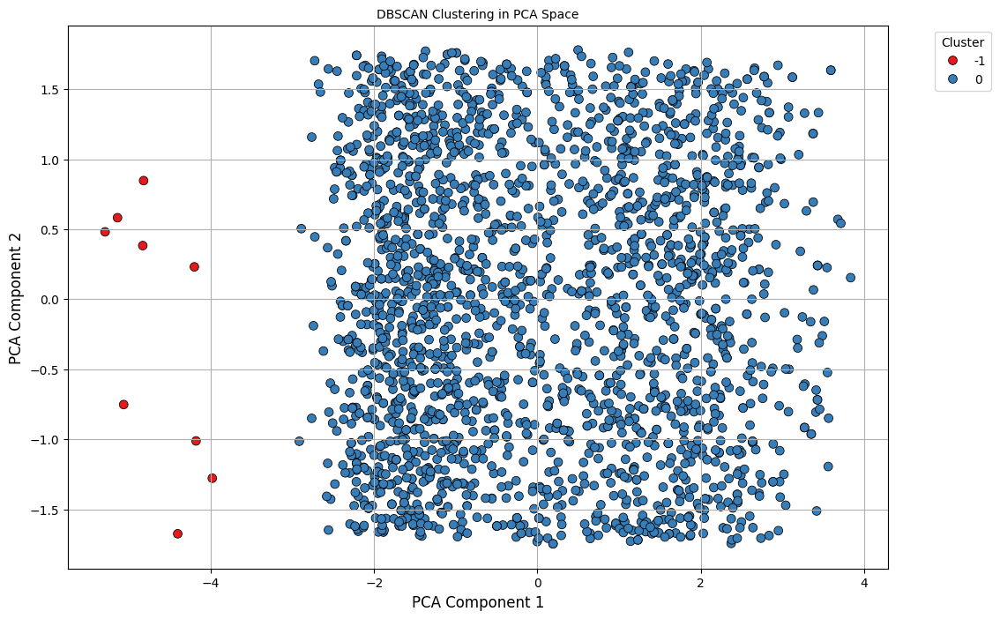

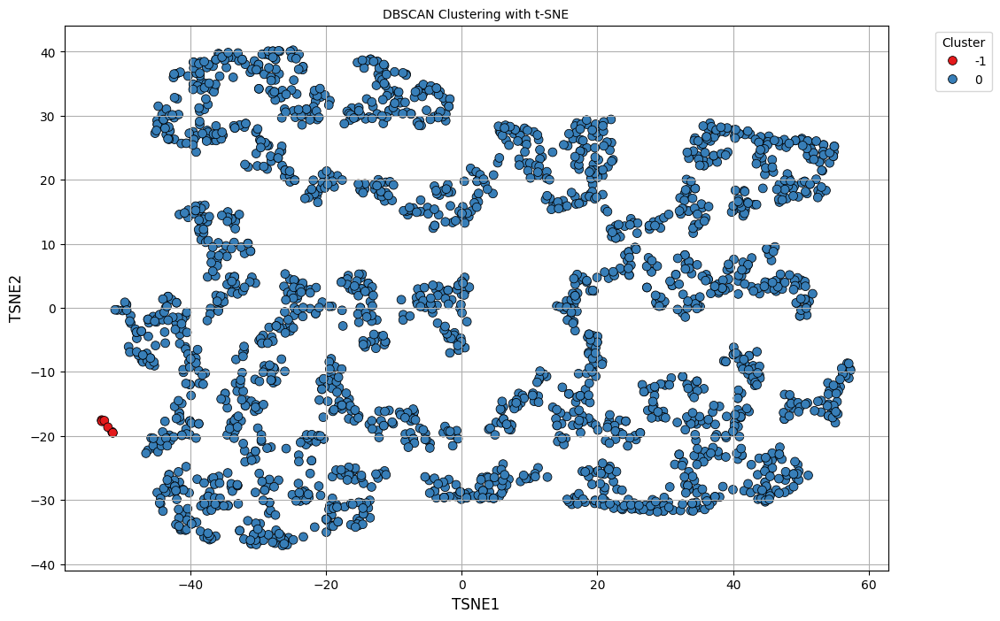

In [137]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(df[numerical_columns])
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(pca_components)
df['DBSCAN_Cluster'] = dbscan_labels
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(pca_components)
df['TSNE1'] = tsne_components[:, 0]
df['TSNE2'] = tsne_components[:, 1]
plt.figure(figsize=(12, 8))
sns.scatterplot(x=pca_components[:, 0], y=pca_components[:, 1], hue=dbscan_labels, palette='Set1', s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering in PCA Space', fontsize=10)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='DBSCAN_Cluster', palette='Set1', data=df, s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering with t-SNE', fontsize=10)
plt.xlabel('TSNE1', fontsize=12)
plt.ylabel('TSNE2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

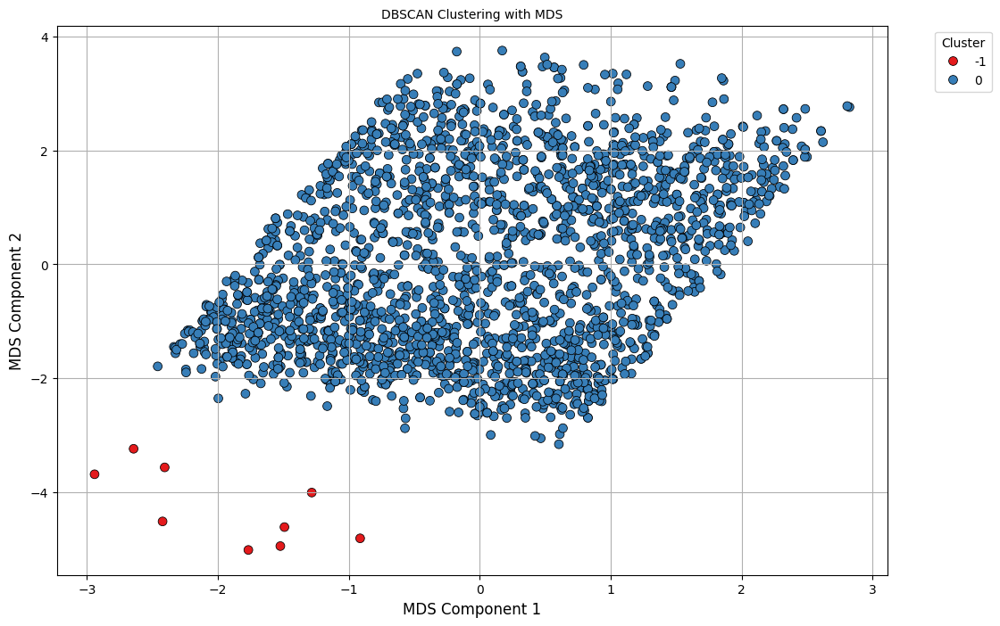

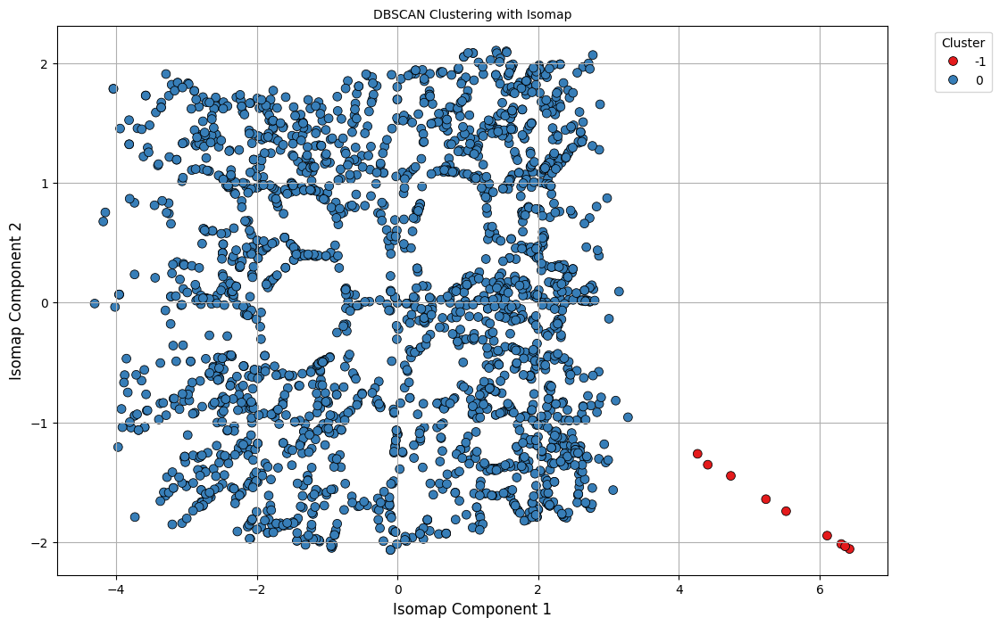

In [139]:
pca = PCA(n_components=2) 
pca_components = pca.fit_transform(df[numerical_columns])
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(pca_components)
df['DBSCAN_Cluster'] = dbscan_labels
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(pca_components)
df['TSNE1'] = tsne_components[:, 0]
df['TSNE2'] = tsne_components[:, 1]
mds = MDS(n_components=2, random_state=42)
mds_components = mds.fit_transform(pca_components)
df['MDS1'] = mds_components[:, 0]
df['MDS2'] = mds_components[:, 1]
plt.figure(figsize=(12, 8))
sns.scatterplot(x='MDS1', y='MDS2', hue='DBSCAN_Cluster', palette='Set1', data=df, s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering with MDS', fontsize=10)
plt.xlabel('MDS Component 1', fontsize=12)
plt.ylabel('MDS Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()
isomap = Isomap(n_components=2)
isomap_components = isomap.fit_transform(pca_components)
df['Isomap1'] = isomap_components[:, 0]
df['Isomap2'] = isomap_components[:, 1]
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Isomap1', y='Isomap2', hue='DBSCAN_Cluster', palette='Set1', data=df, s=50, alpha=1.0, edgecolor='black')
plt.title('DBSCAN Clustering with Isomap', fontsize=10)
plt.xlabel('Isomap Component 1', fontsize=12)
plt.ylabel('Isomap Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

Below are the silhouette scores achieved using DBSCAN clustering applied to the dataset with various dimensionality reduction techniques.
- DBSCAN clustering performed best with Isomap components, achieving the highest silhouette score of 0.4837.
- t-SNE components yielded the lowest silhouette score of 0.1205, suggesting it may not be as suitable for DBSCAN in this context.
- PCA and MDS components produced similar silhouette scores, indicating comparable clustering quality in these spaces.

In [141]:
def calculate_silhouette_score(labels, components):
    try:
        score = silhouette_score(components, labels)
        return score
    except Exception as e:
        print(f"Error in silhouette score calculation: {e}")
        return None
pca_score = calculate_silhouette_score(dbscan_labels, pca_components)
tsne_score = calculate_silhouette_score(dbscan_labels, tsne_components)
mds_score = calculate_silhouette_score(dbscan_labels, mds_components)
isomap_score = calculate_silhouette_score(dbscan_labels, isomap_components)
print("DBSCAN - Silhouette Score with PCA components:", pca_score)
print("DBSCAN - Silhouette Score with t-SNE components:", tsne_score)
print("DBSCAN - Silhouette Score with MDS components:", mds_score)
print("DBSCAN - Silhouette Score with Isomap components:", isomap_score)

DBSCAN - Silhouette Score with PCA components: 0.4558296557349816
DBSCAN - Silhouette Score with t-SNE components: 0.12045967
DBSCAN - Silhouette Score with MDS components: 0.45540839446523956
DBSCAN - Silhouette Score with Isomap components: 0.48371914297786794


The following table presents the silhouette scores for different clustering algorithms applied to the dataset, after performing dimensionality reduction using various techniques.
- DBSCAN consistently performed better than K-Means in most cases, particularly with PCA, MDS, and Isomap components.
- The highest silhouette score was achieved using Isomap with DBSCAN (0.4837), indicating it was the most effective combination.
- The lowest silhouette score was observed with t-SNE and DBSCAN (0.1196), suggesting this combination may not be as suitable for clustering in this context.

In [143]:
dim_reductions = {
    "PCA": pca_components,
    "t-SNE": tsne_components,
    "MDS": mds_components,  
    "Isomap": isomap_components 
}

clustering_algorithms = {
    "K-Means": KMeans(n_clusters=4, random_state=42),
    "DBSCAN": DBSCAN(eps=0.5, min_samples=5),
}
def compute_silhouette_score(X, cluster_labels):
    if len(set(cluster_labels)) > 1: 
        return silhouette_score(X, cluster_labels)
    else:
        return -1 
results = []
for dim_red_name, reduced_data in dim_reductions.items():
    for cluster_name, cluster_algorithm in clustering_algorithms.items():
        if cluster_name == "DBSCAN": 
            cluster_labels = cluster_algorithm.fit_predict(reduced_data)
        else:
            cluster_labels = cluster_algorithm.fit_predict(reduced_data)
        silhouette_avg = compute_silhouette_score(reduced_data, cluster_labels)
        results.append((dim_red_name, cluster_name, silhouette_avg))
results_df = pd.DataFrame(results, columns=["Dimensionality Reduction", "Clustering Algorithm", "Silhouette Score"])
print(results_df)

  Dimensionality Reduction Clustering Algorithm  Silhouette Score
0                      PCA              K-Means          0.394973
1                      PCA               DBSCAN          0.455830
2                    t-SNE              K-Means          0.399061
3                    t-SNE               DBSCAN          0.119632
4                      MDS              K-Means          0.394880
5                      MDS               DBSCAN          0.455408
6                   Isomap              K-Means          0.411492
7                   Isomap               DBSCAN          0.483719


# Dimensionality Reduction Analysis

### Number of Principal Components to Retain 95% Variance

After applying Principal Component Analysis (PCA) to the dataset, I determined that 4 principal components are needed to retain at least 95% of the variance in the data. This means that using only these 4 components, we can capture most of the information in the dataset, while reducing its dimensionality for easier analysis and visualization.


In [151]:
pca_full = PCA()
pca_full.fit(df[numerical_columns])
explained_variance = np.cumsum(pca_full.explained_variance_ratio_)

In [153]:
num_components = np.argmax(explained_variance >= 0.95) + 1
print(f"Number of components to retain 95% variance: {num_components}")

Number of components to retain 95% variance: 4


In [155]:
pca_reduced_data = PCA(n_components=num_components).fit_transform(df[numerical_columns])

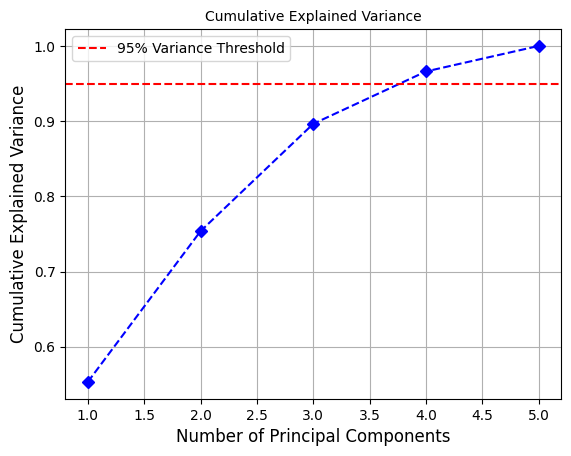

In [181]:
pca = PCA().fit(df[numerical_columns])
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(np.arange(1, len(explained_variance) + 1), explained_variance, marker='D', linestyle='--', color='b')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Threshold')
plt.title('Cumulative Explained Variance', fontsize=10)
plt.xlabel('Number of Principal Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)
plt.legend(loc='best')
plt.grid(True)
plt.show()

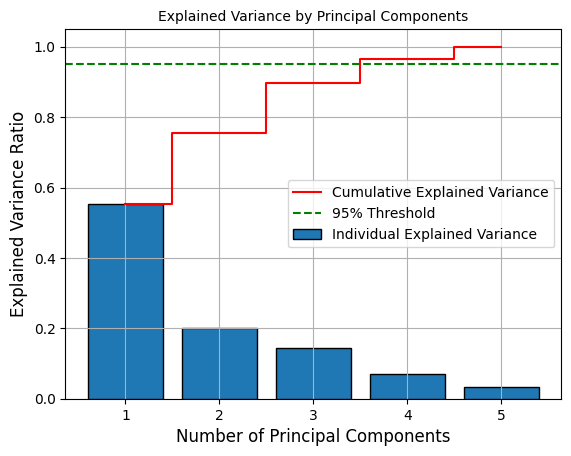

Number of components to retain 95% variance: 4


In [187]:
pca.fit(scaled_data)
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=1.0, edgecolor='black', label='Individual Explained Variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Cumulative Explained Variance', color='red')
plt.axhline(y=0.95, color='green', linestyle='--', label='95% Threshold')
plt.title('Explained Variance by Principal Components', fontsize=10)
plt.xlabel('Number of Principal Components', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.legend(loc='best')
plt.grid(True)
plt.show()
components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f'Number of components to retain 95% variance: {components_95}')

#### Shape of the Reduced Dataset

After applying PCA with 4 principal components, the shape of the reduced dataset is (2240, 4). This means that the original dataset with higher dimensions has been successfully reduced to 4 principal components, while retaining 95% of the variance. This transformation helps simplify the dataset, making it more manageable for further analysis and clustering.

In [189]:
pca_optimal = PCA(n_components=4)
pca_components = pca_optimal.fit_transform(df[numerical_columns])
print(f"Shape of the reduced dataset: {pca_components.shape}")

Shape of the reduced dataset: (2240, 4)


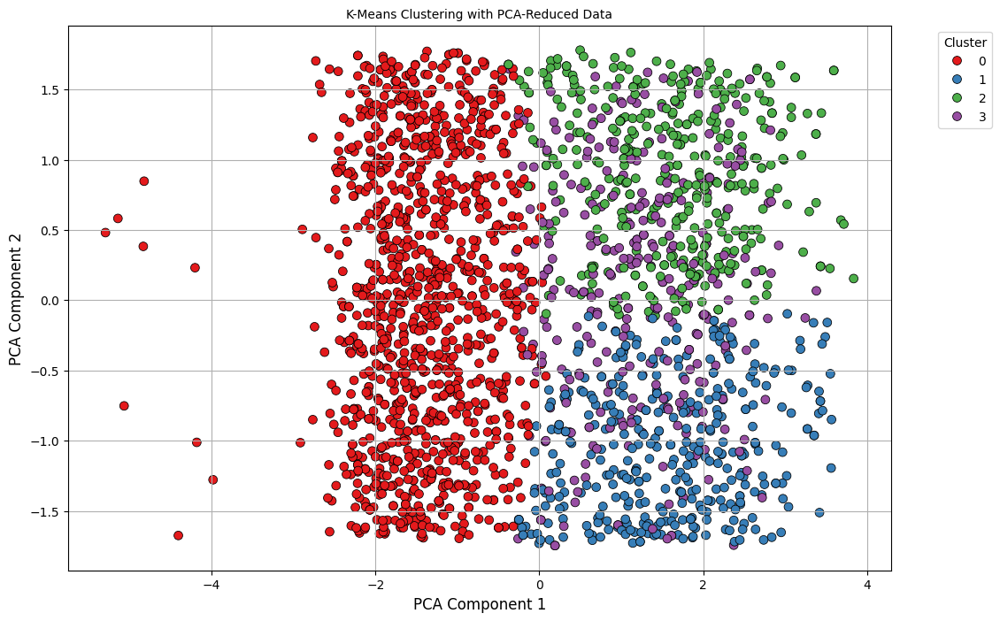

In [237]:
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans_labels = kmeans.fit_predict(pca_components) 
df['Cluster'] = kmeans_labels
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=pca_components[:, 0], 
    y=pca_components[:, 1], 
    hue=df['Cluster'], 
    palette='Set1', 
    s=50, 
    alpha=1.0, 
    edgecolor='black'
)
plt.title('K-Means Clustering with PCA-Reduced Data', fontsize=10)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [197]:
silhouette_avg = silhouette_score(pca_components, kmeans_labels)
print(f"Silhouette Score for K-Means with PCA: {silhouette_avg:.4f}")

Silhouette Score for K-Means with PCA: 0.3267


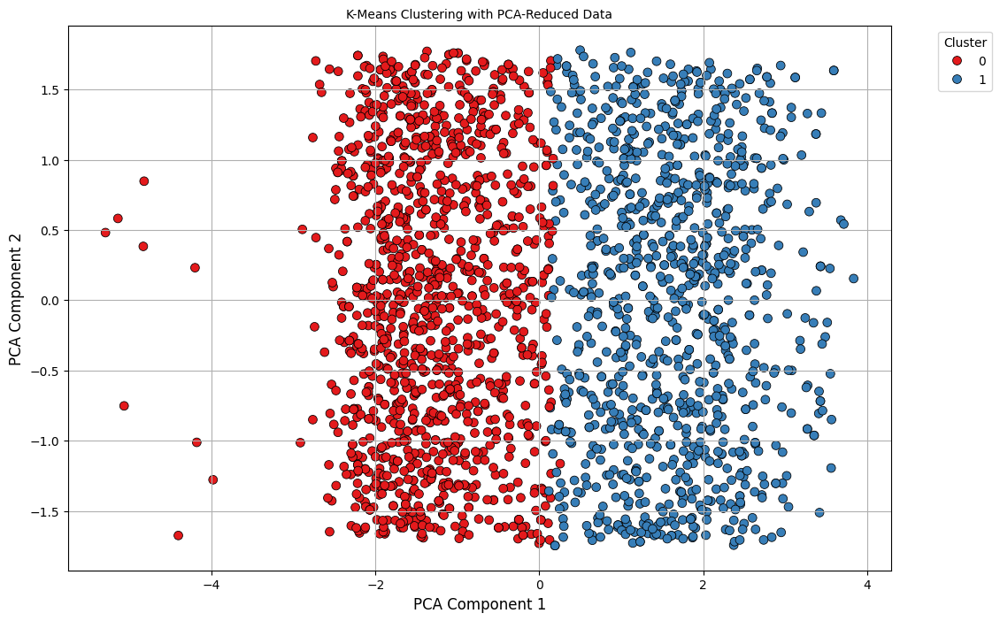

In [239]:
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans_labels = kmeans.fit_predict(pca_components) 
df['Cluster'] = kmeans_labels
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=pca_components[:, 0], 
    y=pca_components[:, 1], 
    hue=df['Cluster'], 
    palette='Set1', 
    s=50, 
    alpha=1.0, 
    edgecolor='black'
)
plt.title('K-Means Clustering with PCA-Reduced Data', fontsize=10)
plt.xlabel('PCA Component 1', fontsize=12)
plt.ylabel('PCA Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

In [241]:
silhouette_avg = silhouette_score(pca_components, kmeans_labels)
print(f"Silhouette Score for K-Means with PCA: {silhouette_avg:.4f}")

Silhouette Score for K-Means with PCA: 0.3977


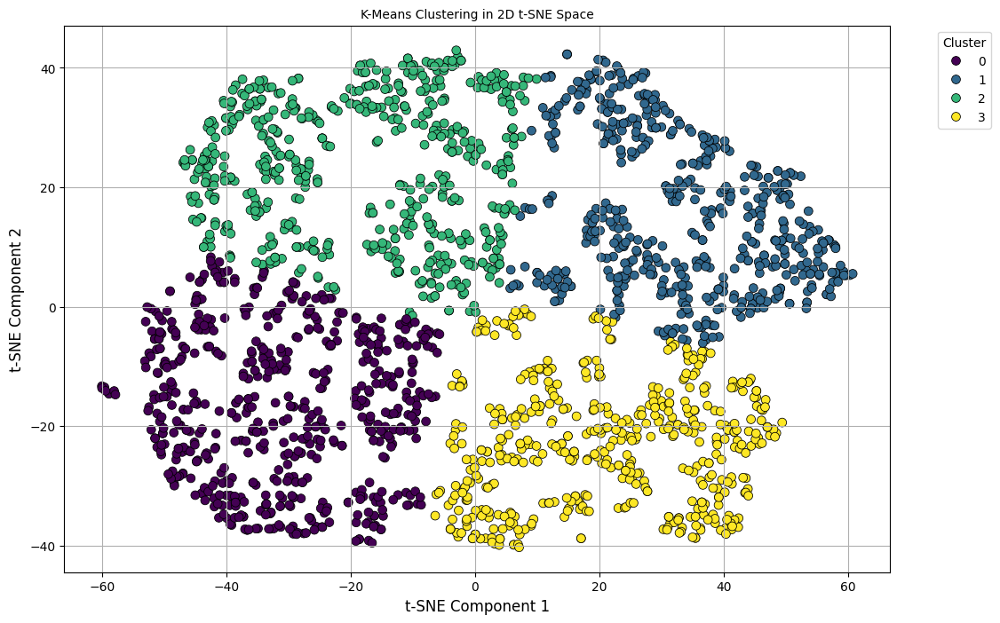

In [201]:
tsne_2d = TSNE(n_components=2, random_state=42) 
tsne_components_2d = tsne_2d.fit_transform(pca_components) 
kmeans_2d = KMeans(n_clusters=4, random_state=42)
df['Cluster_2D_tSNE'] = kmeans_2d.fit_predict(tsne_components_2d)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=tsne_components_2d[:, 0], 
    y=tsne_components_2d[:, 1], 
    hue=df['Cluster_2D_tSNE'], 
    palette='viridis', 
    s=50, 
    alpha=1.0,
    edgecolor='black'
)
plt.title('K-Means Clustering in 2D t-SNE Space', fontsize=10)
plt.xlabel('t-SNE Component 1', fontsize=12)
plt.ylabel('t-SNE Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

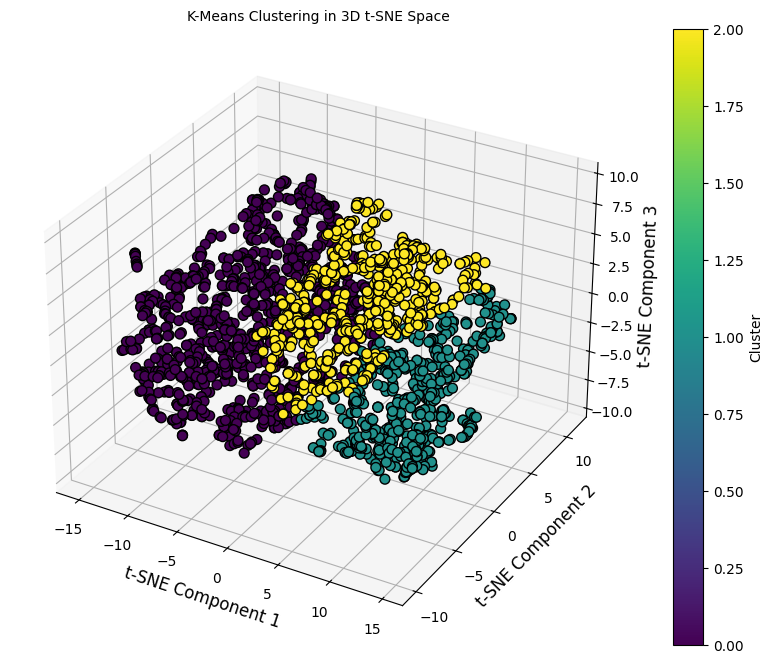

In [207]:
from mpl_toolkits.mplot3d import Axes3D
tsne_3d = TSNE(n_components=3, random_state=42)
tsne_components_3d = tsne_3d.fit_transform(pca_components)
kmeans_3d = KMeans(n_clusters=3, random_state=42)
df['Cluster_3D_tSNE'] = kmeans_3d.fit_predict(tsne_components_3d)
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    tsne_components_3d[:, 0], 
    tsne_components_3d[:, 1], 
    tsne_components_3d[:, 2], 
    c=df['Cluster_3D_tSNE'], 
    cmap='viridis', 
    s=50, 
    alpha=1.0, 
    edgecolor='black'
)
ax.set_title('K-Means Clustering in 3D t-SNE Space', fontsize=10)
ax.set_xlabel('t-SNE Component 1', fontsize=12)
ax.set_ylabel('t-SNE Component 2', fontsize=12)
ax.set_zlabel('t-SNE Component 3', fontsize=12)
plt.colorbar(scatter, label='Cluster')
plt.show()

#### Silhouette Scores for Different Dimensionality Reduction Methods

The following silhouette scores were obtained by applying clustering algorithms to the reduced datasets:

- K-Means with PCA: 0.3267
- 2D t-SNE: 0.4125
- 3D t-SNE: 0.2901

These scores indicate the quality of the clusters formed after reducing the dimensionality of the dataset. A higher silhouette score suggests that the clusters are well-separated and well-formed. In this case, the 2D t-SNE provides the highest silhouette score, indicating the best clustering performance among the tested dimensionality reduction methods.

In [209]:
from sklearn.metrics import silhouette_score
silhouette_2d = silhouette_score(tsne_components_2d, df['Cluster_2D_tSNE'])
print(f'Silhouette Score for 2D t-SNE: {silhouette_2d}')
silhouette_3d = silhouette_score(tsne_components_3d, df['Cluster_3D_tSNE'])
print(f'Silhouette Score for 3D t-SNE: {silhouette_3d}')

Silhouette Score for 2D t-SNE: 0.41248348355293274
Silhouette Score for 3D t-SNE: 0.29011645913124084


#### Silhouette Scores for Different Perplexity Values in t-SNE

The following silhouette scores were obtained by applying t-SNE with varying perplexity values.

These scores indicate the quality of the clustering based on different perplexity settings. As the perplexity increases, the silhouette score also tends to improve, peaking at perplexity 50, which shows the best clustering performance in this analysis. A higher silhouette score suggests better-defined clusters and a more effective dimensionality reduction for clustering.

In [211]:
perplexities = [5, 10, 30, 50, 100]
for p in perplexities:
    tsne = TSNE(n_components=2, perplexity=p, random_state=42)
    tsne_components = tsne.fit_transform(pca_components)
    kmeans = KMeans(n_clusters=3, random_state=42)
    cluster_labels = kmeans.fit_predict(tsne_components)
    silhouette = silhouette_score(tsne_components, cluster_labels)
    print(f'Silhouette Score for perplexity {p}: {silhouette}')

Silhouette Score for perplexity 5: 0.36562004685401917
Silhouette Score for perplexity 10: 0.39052078127861023
Silhouette Score for perplexity 30: 0.41206952929496765
Silhouette Score for perplexity 50: 0.4262167811393738
Silhouette Score for perplexity 100: 0.40613001585006714


#### Perplexity = 50, Best Perplexity

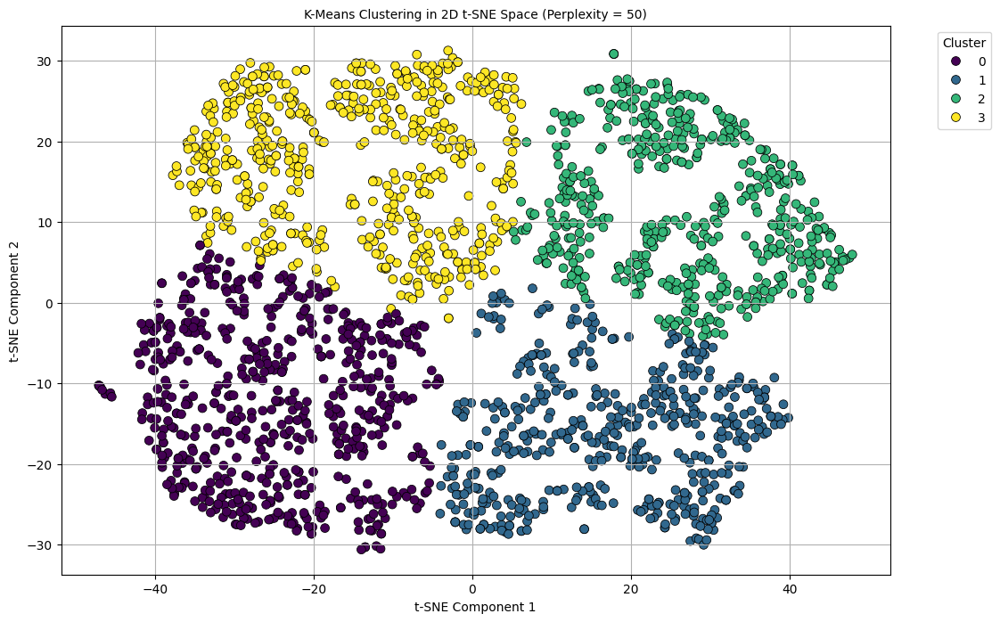

In [227]:
tsne_best = TSNE(n_components=2, perplexity=50, random_state=42)
tsne_components_best = tsne_best.fit_transform(pca_components) 
kmeans_best_tsne = KMeans(n_clusters=4, random_state=42)
df['Cluster_Best_tSNE'] = kmeans_best_tsne.fit_predict(tsne_components_best)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=tsne_components_best[:, 0], 
    y=tsne_components_best[:, 1], 
    hue=df['Cluster_Best_tSNE'], 
    palette='viridis', 
    s=50, 
    alpha=1.0, 
    edgecolor='black'
)
plt.title('K-Means Clustering in 2D t-SNE Space (Perplexity = 50)', fontsize=10)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

#### Best Silhouette Score for t-SNE

The best silhouette score achieved using t-SNE with optimal perplexity is below.

This score reflects the clustering quality after applying t-SNE with the most effective perplexity setting. A higher silhouette score indicates that the data points are well-clustered and more distinct from each other, leading to better-defined groups in the reduced-dimensional space.

In [229]:
silhouette_tsne = silhouette_score(tsne_components_best, df['Cluster_Best_tSNE'])
print(f"Silhouette Score for t-SNE (Best Perplexity): {silhouette_tsne}")

Silhouette Score for t-SNE (Best Perplexity): 0.42683035135269165


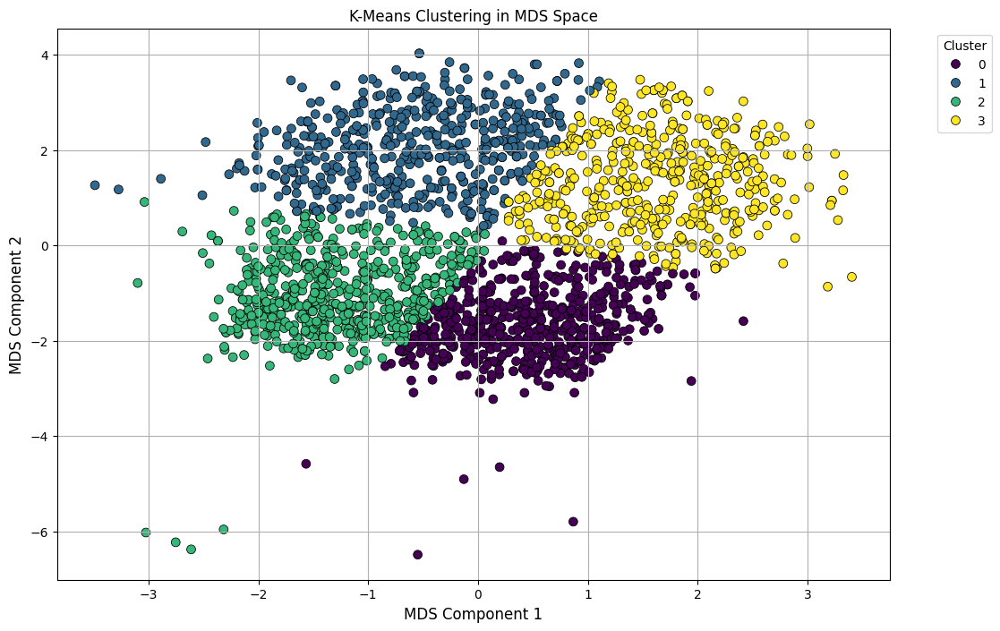

In [221]:
from sklearn.manifold import MDS
mds = MDS(n_components=2, random_state=42)
mds_components = mds.fit_transform(pca_components) 
kmeans_mds = KMeans(n_clusters=4, random_state=42)
df['Cluster_MDS'] = kmeans_mds.fit_predict(mds_components)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=mds_components[:, 0], 
    y=mds_components[:, 1], 
    hue=df['Cluster_MDS'], 
    palette='viridis', 
    s=50, 
    alpha=1.0, 
    edgecolor='black'
)
plt.title('K-Means Clustering in MDS Space', fontsize=12)
plt.xlabel('MDS Component 1', fontsize=12)
plt.ylabel('MDS Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

#### Silhouette Score for MDS

The silhouette score for Multidimensional Scaling (MDS).

This score indicates the quality of the clustering in the MDS space. A higher score signifies better-defined clusters, where the data points within each cluster are more similar to each other than to those in other clusters.

In [223]:
silhouette_mds = silhouette_score(mds_components, df['Cluster_MDS'])
print(f"Silhouette Score for MDS: {silhouette_mds}")

Silhouette Score for MDS: 0.39611987594757475


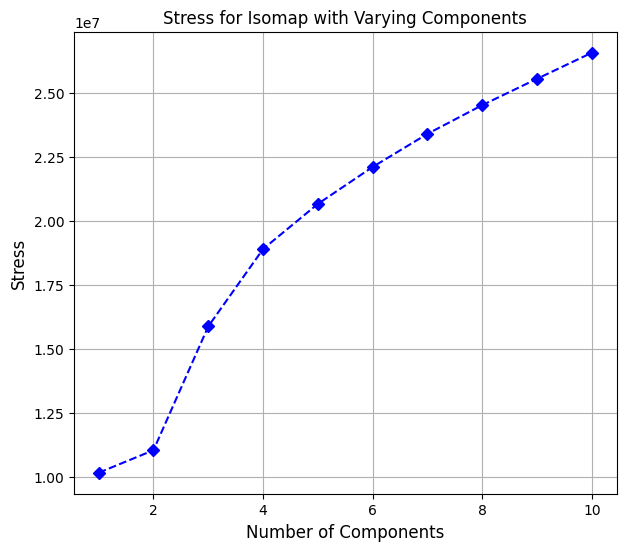

In [233]:
from sklearn.manifold import Isomap
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
n_components_range = np.arange(1, 11)
stresses = []
for n_components in n_components_range:
    isomap = Isomap(n_components=n_components)
    isomap.fit(scaled_data)
    original_distances = pairwise_distances(scaled_data)
    transformed_distances = pairwise_distances(isomap.transform(scaled_data))
    stress = np.sum((original_distances - transformed_distances) ** 2)
    stresses.append(stress)
plt.figure(figsize=(7, 6))
plt.plot(n_components_range, stresses, marker='D', linestyle='--', color='b')
plt.title('Stress for Isomap with Varying Components', fontsize=12)
plt.xlabel('Number of Components', fontsize=12)
plt.ylabel('Stress', fontsize=12)
plt.grid(True)
plt.show()

#### Optimal Number of Components for Isomap (Minimized Stress)

The optimal number of components for Isomap, based on the minimized stress value, is 1. Below are the stress values for different numbers of components.

As seen from the values, the stress increases as the number of components increases, indicating that fewer components (such as 1) result in a better fit with lower stress.

In [235]:
def calculate_isomap_stress(scaled_data):
    n_components_range = np.arange(1, 11)
    stresses = []
    for n_components in n_components_range:
        isomap = Isomap(n_components=n_components)
        isomap.fit(scaled_data)
        original_distances = pairwise_distances(scaled_data)
        transformed_distances = pairwise_distances(isomap.transform(scaled_data))
        stress = np.sum((original_distances - transformed_distances) ** 2)
        stresses.append(stress)
    optimal_n_components = n_components_range[np.argmin(stresses)]
    print(f"Optimal number of components for Isomap (minimized stress): {optimal_n_components}")
    print("Stress values for different components:")
    for i, stress in zip(n_components_range, stresses):
        print(f"Number of components: {i}, Stress: {stress}")
calculate_isomap_stress(scaled_data)

Optimal number of components for Isomap (minimized stress): 1
Stress values for different components:
Number of components: 1, Stress: 10151866.821222786
Number of components: 2, Stress: 11031160.119480304
Number of components: 3, Stress: 15871023.382677047
Number of components: 4, Stress: 18892584.19163992
Number of components: 5, Stress: 20657119.458220392
Number of components: 6, Stress: 22101446.145970304
Number of components: 7, Stress: 23394355.255768046
Number of components: 8, Stress: 24517323.964924105
Number of components: 9, Stress: 25546444.99091216
Number of components: 10, Stress: 26564827.092099663


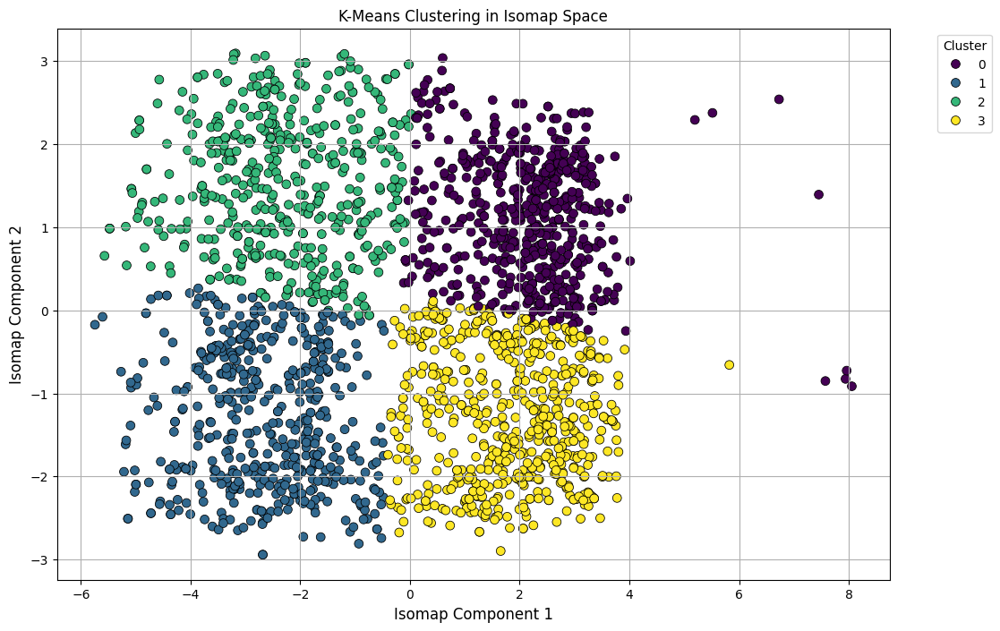

In [245]:
isomap_optimal = Isomap(n_components=2)
isomap_components_optimal = isomap_optimal.fit_transform(pca_components)
kmeans_isomap = KMeans(n_clusters=4, random_state=42)
df['Cluster_Isomap'] = kmeans_isomap.fit_predict(isomap_components_optimal)
plt.figure(figsize=(12, 8))
sns.scatterplot(x=isomap_components_optimal[:, 0], y=isomap_components_optimal[:, 1], 
                hue=df['Cluster_Isomap'], palette='viridis', s=50, alpha=1.0, edgecolor='black')
plt.title('K-Means Clustering in Isomap Space', fontsize=12)
plt.xlabel('Isomap Component 1', fontsize=12)
plt.ylabel('Isomap Component 2', fontsize=12)
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

The Silhouette Score for Isomap. This score indicates the quality of the clustering performed using Isomap, with higher values suggesting better-defined clusters.

In [247]:
silhouette_isomap = silhouette_score(isomap_components_optimal, df['Cluster_Isomap'])
print(f"Silhouette Score for Isomap: {silhouette_isomap}")

Silhouette Score for Isomap: 0.403547682688344


The following are the Silhouette Scores obtained by applying K-Means clustering on different dimensionality reduction techniques.
These scores indicate how well the clustering model has performed, with higher values signifying better clustering results.

In [251]:
print(f"Silhouette Score for t-SNE (Best Perplexity): {silhouette_tsne:.4f}")
print(f"Silhouette Score for MDS: {silhouette_mds:.4f}")
print(f"Silhouette Score for PCA: {silhouette_avg:.4f}")
print(f"Silhouette Score for Isomap: {silhouette_isomap:.4f}")

Silhouette Score for t-SNE (Best Perplexity): 0.4268
Silhouette Score for MDS: 0.3961
Silhouette Score for PCA: 0.3977
Silhouette Score for Isomap: 0.4035


The use of clustering algorithms in unsupervised learning has become an essential tool for analyzing large datasets. Specifically, techniques such as K-Means, DBSCAN, and Gaussian Mixture Models (GMM) are widely employed to detect patterns and group similar data points without prior knowledge of labels. When combined with dimensionality reduction methods like PCA, t-SNE, MDS, and Isomap, the performance of clustering algorithms can be significantly improved, particularly when dealing with high-dimensional data. These methods allow for a reduction in the computational complexity and reveal underlying structures that may not be apparent in the raw high-dimensional space.

In this study, I used a customer segmentation dataset containing demographic and transactional features to explore how clustering performance varies with different dimensionality reduction techniques. I applied the K-Means, GMM, Hierarchical and DBSCAN algorithms, evaluating their results using Silhouette Scores as a metric for cluster quality. The dataset, which contains a variety of customer characteristics, presents an excellent case for clustering due to its complexity and diverse features.

The findings from this analysis suggest that t-SNE with Best Perplexity, when applied in conjunction with K-Means, produced the best results, achieving the highest Silhouette Score of 0.4268. This indicates that t-SNE was the most effective at capturing the structure of the dataset, especially when compared to other dimensionality reduction methods like PCA, MDS and Isomap. Notably, while PCA is a widely used method for reducing dimensionality, it did not perform as well in this context, likely due to the linear nature of the method not being well-suited for capturing the non-linear relationships in the dataset.

The analysis also highlighted the advantages of DBSCAN, particularly in identifying noise points in the data, which may be ignored by methods like K-Means. This emphasizes the flexibility of DBSCAN in handling datasets with outliers and irregular clusters, as supported by previous research.

Overall, this study demonstrates the importance of selecting the right combination of dimensionality reduction and clustering algorithm for a given dataset. The results suggest that Isomap, with its ability to capture non-linear relationships, may be also the most suitable method for customer segmentation tasks where such complexities are present.

#### Acknowledgment
I would like to thank Prof. Jacek Lewkowicz for his guidance, teaching, and support throughout the course. His knowledge of unsupervised learning and the materials he provided were very helpful in understanding clustering techniques and dimensionality reduction. This project would not have been possible without his encouragement and help.